In [1]:
import warnings
warnings.filterwarnings('ignore')
import sys
import os
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), "..", "utils")))
from analysis_utils import (
    volcano_plot_br,
    plot_spatial_clusters_per_sample,
    plot_dotplot_by_treatment,
    plot_relative_cluster_composition,
    score_and_plot_modules
)
import scanpy as sc
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt

In [32]:
adata = sc.read_h5ad('../data/ST_BRICHOS_region_subcluster.h5ad')

In [33]:
compartment_anno = {
    0: 'Caudoputamen',
    1: 'Supragranualar layers',
    2: 'Infragranular layers',
    3: 'Hypothalamus',
    4: 'Corpus callosum',
    5: 'Olfactory areas',
    6: 'Hypothalamus',
    7: 'Meninges',
    8: 'Hippocampal formation',
    9: 'Thalamus',
    10: 'Thalamus',
    11: 'Caudoputamen',
    12: 'Ventricular area'
}

In [36]:
adata.obs['re_annotation_regions'] = adata.obs['leiden_0.3'].astype(int).map(compartment_anno)

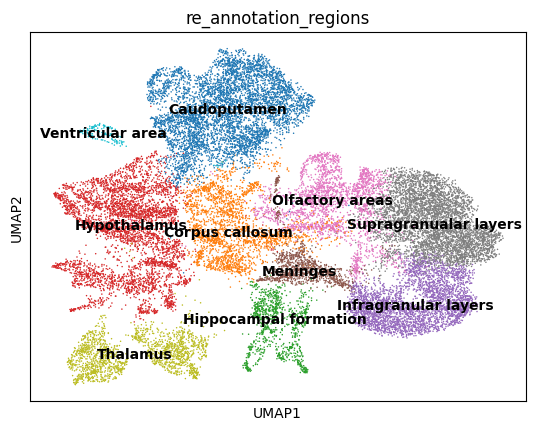

In [37]:
sc.pl.umap(adata, color = 're_annotation_regions', legend_loc = 'on data')

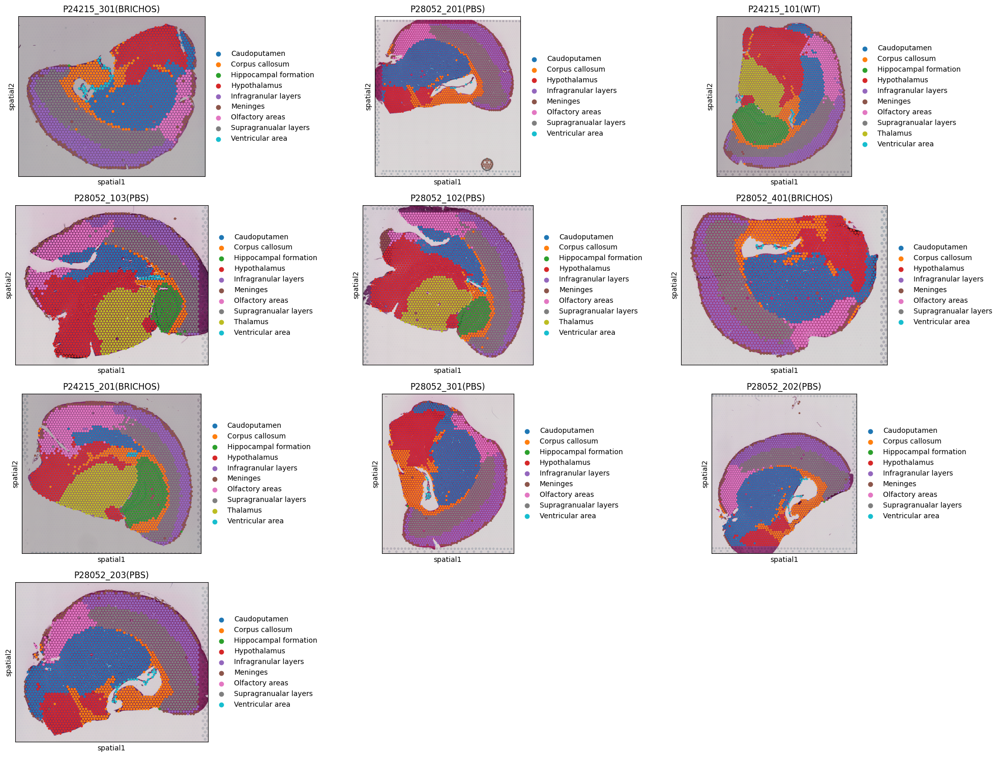

In [38]:
plot_spatial_clusters_per_sample(adata, color = 're_annotation_regions', figsize=(20,15), )

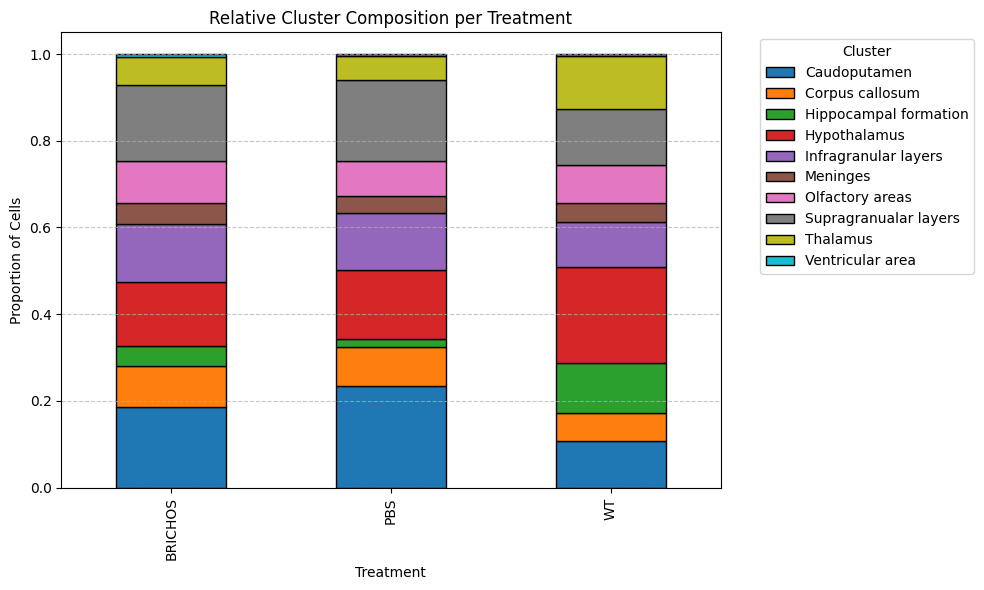

In [39]:
plot_relative_cluster_composition(adata, cluster_key="re_annotation_regions")

In [113]:
pig_genes = ['Abi3',
  'Apoe',
  'Axl',
  'B2m',
  'C1qa',
  'C1qb',
  'C1qc',
  'C3ar1',
  'C4b',
  'Ccl6',
  'Cd33',
  'Cd68',
  'Cd9',
  'Csf1',
  'Csf1r',
  'Cst7',
  'Ctss',
  'Ctsb',
  'Ctsd',
  'Cyba',
  'Cyp27a1',
  'Dock2',
  'Fcgr1',
  'Fcgr2b',
  'Fcgr3',
  'Fcer1g',
  'Fcrls',
  'Gpnmb',
  'Grn',
  'Gusb',
  'Hexb',
  'H2-Ab1',
  'H2-Eb1',
  'H2-Aa',
  'Itgax',
  'Laptm5',
  'Lgmn',
  'Lyz2',
  'Mpeg1',
  'Msr1',
  'Pf4',
  'Plek',
  'Prdx6',
  'Psap',
  'S100a4',
  'S100a6',
  'S100a11',
  'Spp1',
  'Timp2',
  'Trem2',
  'Tyrobp',
  'Vim',
  'Vsir']

In [115]:
import numpy as np
import pandas as pd
import scanpy as sc

# ensure the genes exist
genes_in_data = [g for g in pig_genes if g in adata.var_names]
print(f"{len(genes_in_data)} plaque genes found in dataset")

# compute per-cell plaque score
adata.obs["plaque_score"] = adata[:, genes_in_data].X.mean(1).A1 \
    if hasattr(adata[:, genes_in_data].X, "A1") else adata[:, genes_in_data].X.mean(1)

53 plaque genes found in dataset


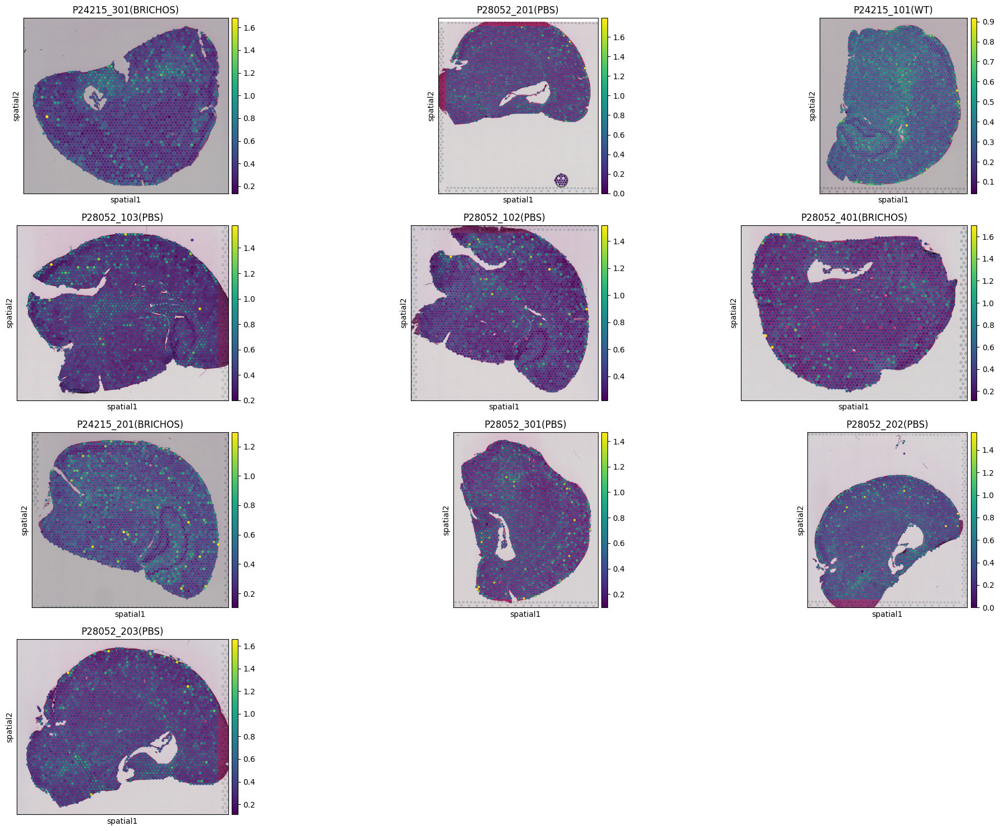

In [63]:
plot_spatial_clusters_per_sample(adata, color = 'plaque_score', figsize=(20,15))

In [64]:
df = (
    adata.obs
    .groupby(["re_annotation_regions", "treatment"])["plaque_score"]
    .mean()
    .reset_index()
)

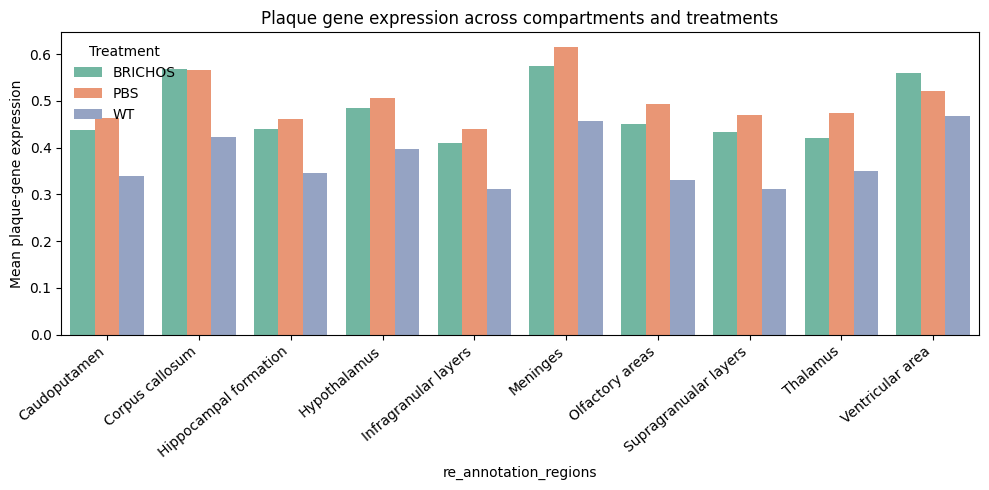

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,5))
sns.barplot(
    data=df,
    x="re_annotation_regions", y="plaque_score",
    hue="treatment", palette="Set2",
)
plt.xticks(rotation=40, ha="right")
plt.ylabel("Mean plaque-gene expression")
plt.title("Plaque gene expression across compartments and treatments")
plt.legend(title="Treatment", frameon=False)
plt.tight_layout()
plt.show()

In [66]:
adata

AnnData object with n_obs × n_vars = 25660 × 18751
    obs: 'in_tissue', 'array_row', 'array_col', 'pxl_row_in_fullres', 'pxl_col_in_fullres', 'sample', 'sample_id', 'n_genes', 'leiden', 'treatment', 'barcode', 'region_annotation', 'leiden_0.5', 'leiden_0.75', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'PIG_score', 'OLIG_score', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 're_annotation_regions', 'plaque_score'
    var: 'n_cells'
    uns: 'dendrogram_treatment', 'leiden', 'leiden_0.1_colors', 'leiden_0.2_colors', 'leiden_0.3_colors', 'leiden_0.5_colors', 'leiden_0.75_colors', 'leiden_1.5_colors', 'leiden_1_colors', 'leiden_2.5_colors', 'leiden_2_colors', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'region_annotation_colors', 'sample_id_colors', 'spatial', 'spatial_metadata_per_sample', 'umap', 're_annotation_regions_colors'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [67]:
import statsmodels.formula.api as smf
import pandas as pd

df = adata.obs.copy()
df["plaque_score"] = adata.obs["plaque_score"]
df = df.dropna(subset=["plaque_score", "treatment", "re_annotation_regions", "sample_id"])

# Example: mixed model with treatment + compartment and random intercept per mouse
model = smf.mixedlm(
    "plaque_score ~ treatment * re_annotation_regions",
    df,
    groups=df["sample_id"],
)
res = model.fit()
print(res.summary())

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2201: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  warnings.warn(


                                  Mixed Linear Model Regression Results
Model:                            MixedLM                 Dependent Variable:                 plaque_score
No. Observations:                 25660                   Method:                             REML        
No. Groups:                       10                      Scale:                              0.0172      
Min. group size:                  2201                    Log-Likelihood:                     15569.1990  
Max. group size:                  2957                    Converged:                          Yes         
Mean group size:                  2566.0                                                                  
----------------------------------------------------------------------------------------------------------
                                                                Coef.  Std.Err.   z    P>|z| [0.025 0.975]
------------------------------------------------------------------------

/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2238: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/Users/christoffer/miniconda3/envs/sc/lib/python3.8/site-packages/statsmodels/regression/mixed_linear_model.py:2262: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


In [51]:
significant = (
    res.pvalues[res.pvalues < 0.05]
    .rename("pval")
    .reset_index()
    .query("index.str.contains('treatment') and index.str.contains('re_annotation_regions')")
)
print(significant)

                                                index          pval
7   treatment[T.PBS]:re_annotation_regions[T.Corpu...  4.326436e-07
8   treatment[T.WT]:re_annotation_regions[T.Corpus...  1.065606e-02
9   treatment[T.PBS]:re_annotation_regions[T.Hippo...  2.410008e-04
10  treatment[T.PBS]:re_annotation_regions[T.Hypot...  4.313162e-04
11  treatment[T.WT]:re_annotation_regions[T.Meninges]  2.760708e-02
12  treatment[T.WT]:re_annotation_regions[T.Olfact...  2.251215e-02
13  treatment[T.WT]:re_annotation_regions[T.Suprag...  1.002421e-02
14  treatment[T.PBS]:re_annotation_regions[T.Thala...  3.357422e-02


In [57]:
significant

,index,pval
7,treatment[T.PBS]:re_annotation_regions[T.Corpu...,4.326436e-07
8,treatment[T.WT]:re_annotation_regions[T.Corpus...,1.065606e-02
9,treatment[T.PBS]:re_annotation_regions[T.Hippo...,2.410008e-04
10,treatment[T.PBS]:re_annotation_regions[T.Hypot...,4.313162e-04
11,treatment[T.WT]:re_annotation_regions[T.Meninges],2.760708e-02
12,treatment[T.WT]:re_annotation_regions[T.Olfact...,2.251215e-02
13,treatment[T.WT]:re_annotation_regions[T.Suprag...,1.002421e-02
14,treatment[T.PBS]:re_annotation_regions[T.Thala...,3.357422e-02


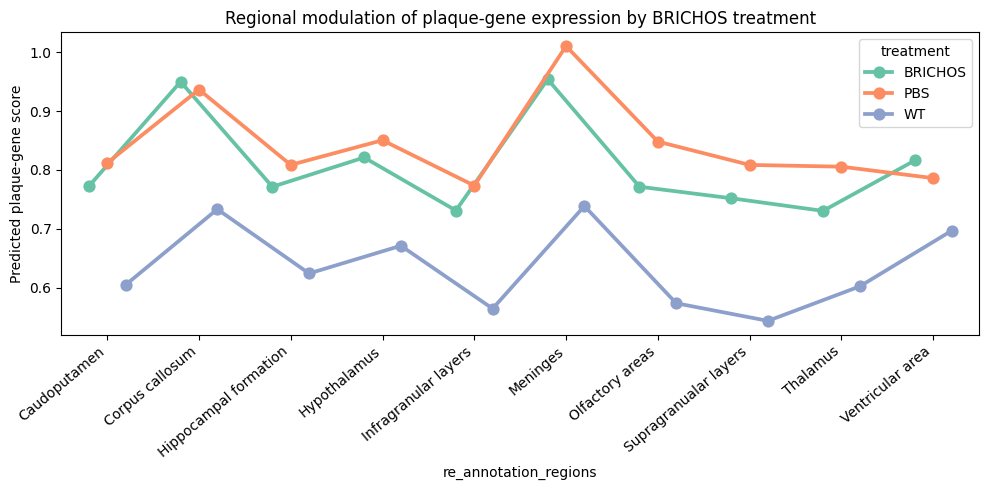

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm

# Get estimated marginal means (model predictions)
pred_df = df.groupby(["treatment", "re_annotation_regions"])["plaque_score"].mean().reset_index()

plt.figure(figsize=(10,5))
sns.pointplot(
    data=pred_df,
    x="re_annotation_regions", y="plaque_score",
    hue="treatment", dodge=0.4, markers="o", capsize=0.1,
    palette="Set2"
)
plt.xticks(rotation=40, ha="right")
plt.ylabel("Predicted plaque-gene score")
plt.title("Regional modulation of plaque-gene expression by BRICHOS treatment")
plt.tight_layout()
plt.show()

In [54]:
import pandas as pd

# Extract coefficients and p-values from the mixed model
summary = pd.DataFrame({
    "coef": res.params,
    "pval": res.pvalues
})

# Filter for treatment × region interactions
pbs_interactions = summary.loc[summary.index.str.contains("treatment\[T.PBS\]:re_annotation_regions")].copy()

# Clean region names for plotting
pbs_interactions["region"] = (
    pbs_interactions.index
    .str.extract(r"re_annotation_regions\[T\.(.+)\]")[0]
    .str.replace("_", " ")
)
pbs_interactions["sig"] = pbs_interactions["pval"] < 0.05
pbs_interactions.head()

,coef,pval,region,sig
treatment[T.PBS]:re_annotation_regions[T.Corpus callosum],-0.059574,4.326436e-07,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Hippocampal formation],-0.069189,2.410008e-04,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Hypothalamus],-0.036469,4.313162e-04,NaN,True
treatment[T.PBS]:re_annotation_regions[T.Infragranular layers],-0.009552,3.657604e-01,NaN,False
treatment[T.PBS]:re_annotation_regions[T.Meninges],0.002397,8.772938e-01,NaN,False


In [68]:
from scipy.stats import mannwhitneyu, ttest_ind

results = []
for region in df["re_annotation_regions"].unique():
    sub = df[df["re_annotation_regions"] == region]
    pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"]
    bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"]
    stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
    results.append({"region": region, "pval": p, "mean_diff": bri.mean() - pbs.mean()})

pd.DataFrame(results).sort_values("pval")

,region,pval,mean_diff
2,Supragranualar layers,7.973535e-45,-0.037391
9,Thalamus,1.040611e-36,-0.053348
4,Caudoputamen,1.731127e-26,-0.024791
3,Infragranular layers,8.333443e-14,-0.028291
1,Hypothalamus,1.007587e-13,-0.020287
0,Olfactory areas,1.865814e-10,-0.043833
5,Meninges,6.990543e-03,-0.041166
8,Hippocampal formation,2.123546e-02,-0.021351
6,Corpus callosum,3.166712e-02,0.002191
7,Ventricular area,4.621177e-02,0.038486


In [69]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

model = ols('plaque_score ~ treatment * re_annotation_regions', data=df).fit()
sm.stats.anova_lm(model, typ=2)

,sum_sq,df,F,PR(>F)
treatment,40.681782,2.0,1172.694107,0.000000e+00
re_annotation_regions,50.033340,9.0,320.502752,0.000000e+00
treatment:re_annotation_regions,1.940301,18.0,6.214575,1.547535e-15
Residual,444.563529,25630.0,NaN,NaN


In [76]:
import pandas as pd
from scipy.stats import mannwhitneyu

pb = (
    adata.obs
    .groupby(["sample_id", "treatment", "re_annotation_regions"])["plaque_score"]
    .mean()
    .reset_index()
)

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]
    # make sure we have both groups
    if set(sub["treatment"]) >= {"PBS", "BRICHOS"}:
        pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"]
        bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"]
        stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
        rows.append({
            "region": region,
            "n_PBS": len(pbs),
            "n_BRICHOS": len(bri),
            "mean_PBS": pbs.mean(),
            "mean_BRICHOS": bri.mean(),
            "Δ_BRICHOS_minus_PBS": bri.mean() - pbs.mean(),
            "pval": p,
        })

res_region = pd.DataFrame(rows).sort_values("pval")
res_region["p_adj_fdr"] = pd.Series(
    pd.Series(res_region["pval"]).rank(method="first")  # placeholder for order
)
# proper FDR:
from statsmodels.stats.multitest import multipletests
res_region["p_adj_fdr"] = multipletests(res_region["pval"], method="fdr_bh")[1]

res_region

,region,n_PBS,n_BRICHOS,mean_PBS,mean_BRICHOS,Δ_BRICHOS_minus_PBS,pval,p_adj_fdr
0,Caudoputamen,10,10,0.469166,0.441593,-0.027573,NaN,NaN
1,Corpus callosum,10,10,0.573254,0.573357,0.000102,NaN,NaN
2,Hippocampal formation,10,10,0.450289,0.441971,-0.008319,NaN,NaN
3,Hypothalamus,10,10,0.503778,0.490001,-0.013776,NaN,NaN
4,Infragranular layers,10,10,0.439275,0.410121,-0.029154,NaN,NaN
5,Meninges,10,10,0.618533,0.575058,-0.043475,NaN,NaN
6,Olfactory areas,10,10,0.485669,0.450574,-0.035095,NaN,NaN
7,Supragranualar layers,10,10,0.469846,0.430420,-0.039426,NaN,NaN
8,Thalamus,10,10,0.474149,0.420801,-0.053348,NaN,NaN
9,Ventricular area,10,10,0.521741,0.541773,0.020032,NaN,NaN


In [77]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]
    # need at least 2 treatments
    if sub["treatment"].nunique() < 2:
        continue
    model = ols("plaque_score ~ C(treatment)", data=sub).fit()
    aov = sm.stats.anova_lm(model, typ=2)
    rows.append({
        "region": region,
        "pval": aov["PR(>F)"]["C(treatment)"],
        "n": len(sub),
        "means": sub.groupby("treatment")["plaque_score"].mean().to_dict()
    })

res_aov = pd.DataFrame(rows).sort_values("pval")
# FDR
from statsmodels.stats.multitest import multipletests
res_aov["p_adj_fdr"] = multipletests(res_aov["pval"], method="fdr_bh")[1]
res_aov

,region,pval,n,means,p_adj_fdr
4,Infragranular layers,0.000002,30,"{'BRICHOS': 0.41012081503868103, 'PBS': 0.4392...",0.000024
7,Supragranualar layers,0.000069,30,"{'BRICHOS': 0.430419921875, 'PBS': 0.469845920...",0.000347
0,Caudoputamen,0.001179,30,"{'BRICHOS': 0.4415926933288574, 'PBS': 0.46916...",0.003930
8,Thalamus,0.002902,30,"{'BRICHOS': 0.4208014905452728, 'PBS': 0.47414...",0.007255
5,Meninges,0.025554,30,"{'BRICHOS': 0.5750579833984375, 'PBS': 0.61853...",0.051107
3,Hypothalamus,0.032243,30,"{'BRICHOS': 0.4900014102458954, 'PBS': 0.50377...",0.053739
1,Corpus callosum,0.072494,30,"{'BRICHOS': 0.573356568813324, 'PBS': 0.573254...",0.094557
6,Olfactory areas,0.075646,30,"{'BRICHOS': 0.4505736827850342, 'PBS': 0.48566...",0.094557
9,Ventricular area,0.436050,30,"{'BRICHOS': 0.5417734980583191, 'PBS': 0.52174...",0.484500
2,Hippocampal formation,0.690540,30,"{'BRICHOS': 0.4419708847999573, 'PBS': 0.45028...",0.690540


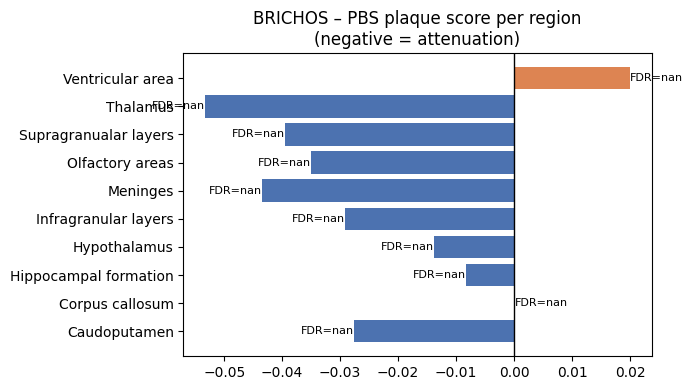

In [78]:
import matplotlib.pyplot as plt

sig = res_region.sort_values("p_adj_fdr").head(10)

plt.figure(figsize=(7, 4))
plt.barh(sig["region"], sig["Δ_BRICHOS_minus_PBS"], color=[
    "#4c72b0" if d < 0 else "#dd8452" for d in sig["Δ_BRICHOS_minus_PBS"]
])
plt.axvline(0, color="k", lw=1)
for i, (r, p) in enumerate(zip(sig["region"], sig["p_adj_fdr"])):
    plt.text(
        sig["Δ_BRICHOS_minus_PBS"].iloc[i],
        i,
        f"FDR={p:.3f}",
        va="center",
        ha="left" if sig["Δ_BRICHOS_minus_PBS"].iloc[i] > 0 else "right",
        fontsize=8,
    )
plt.title("BRICHOS – PBS plaque score per region\n(negative = attenuation)")
plt.tight_layout()
plt.show()

In [80]:
import pandas as pd
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests
import numpy as np

# --- Pseudobulk plaque score per mouse × region ---
pb = (
    adata.obs
    .groupby(["sample_id", "treatment", "re_annotation_regions"])["plaque_score"]
    .mean()
    .reset_index()
)

rows = []
for region in pb["re_annotation_regions"].unique():
    sub = pb[pb["re_annotation_regions"] == region]

    # Require both groups to exist and at least 2 mice per group
    if set(sub["treatment"]) >= {"PBS", "BRICHOS"}:
        pbs = sub.loc[sub["treatment"] == "PBS", "plaque_score"].dropna()
        bri = sub.loc[sub["treatment"] == "BRICHOS", "plaque_score"].dropna()
        if len(pbs) >= 2 and len(bri) >= 2:
            stat, p = mannwhitneyu(pbs, bri, alternative="two-sided")
            rows.append({
                "region": region,
                "n_PBS": len(pbs),
                "n_BRICHOS": len(bri),
                "mean_PBS": pbs.mean(),
                "mean_BRICHOS": bri.mean(),
                "Δ_BRICHOS_minus_PBS": bri.mean() - pbs.mean(),
                "pval": p,
            })

res_region = pd.DataFrame(rows)

# --- Handle missing / constant cases safely ---
res_region = res_region.replace([np.inf, -np.inf], np.nan).dropna(subset=["pval"])
if len(res_region) > 0:
    res_region["p_adj_fdr"] = multipletests(res_region["pval"], method="fdr_bh")[1]
else:
    res_region["p_adj_fdr"] = np.nan

# Sort by raw p-value
res_region = res_region.sort_values("pval")
res_region

,region,n_PBS,n_BRICHOS,mean_PBS,mean_BRICHOS,Δ_BRICHOS_minus_PBS,pval,p_adj_fdr
4,Infragranular layers,6,3,0.439275,0.410121,-0.029154,0.023810,0.107143
7,Supragranualar layers,6,3,0.469846,0.430420,-0.039426,0.023810,0.107143
0,Caudoputamen,6,3,0.469166,0.441593,-0.027573,0.095238,0.285714
5,Meninges,6,3,0.618533,0.575058,-0.043475,0.166667,0.375000
3,Hypothalamus,6,3,0.503778,0.490001,-0.013776,0.547619,0.821429
8,Ventricular area,6,3,0.521741,0.541773,0.020032,0.547619,0.821429
1,Corpus callosum,6,3,0.573254,0.573357,0.000102,0.714286,0.918367
2,Hippocampal formation,5,2,0.450289,0.441971,-0.008319,0.857143,0.964286
6,Olfactory areas,6,3,0.485669,0.450574,-0.035095,1.000000,1.000000


In [84]:
res_region[["region", "pval", "p_adj_fdr", "Δ_BRICHOS_minus_PBS"]].sort_values("pval").head(10)

,region,pval,p_adj_fdr,Δ_BRICHOS_minus_PBS
4,Infragranular layers,0.023810,0.107143,-0.029154
7,Supragranualar layers,0.023810,0.107143,-0.039426
0,Caudoputamen,0.095238,0.285714,-0.027573
5,Meninges,0.166667,0.375000,-0.043475
3,Hypothalamus,0.547619,0.821429,-0.013776
8,Ventricular area,0.547619,0.821429,0.020032
1,Corpus callosum,0.714286,0.918367,0.000102
2,Hippocampal formation,0.857143,0.964286,-0.008319
6,Olfactory areas,1.000000,1.000000,-0.035095


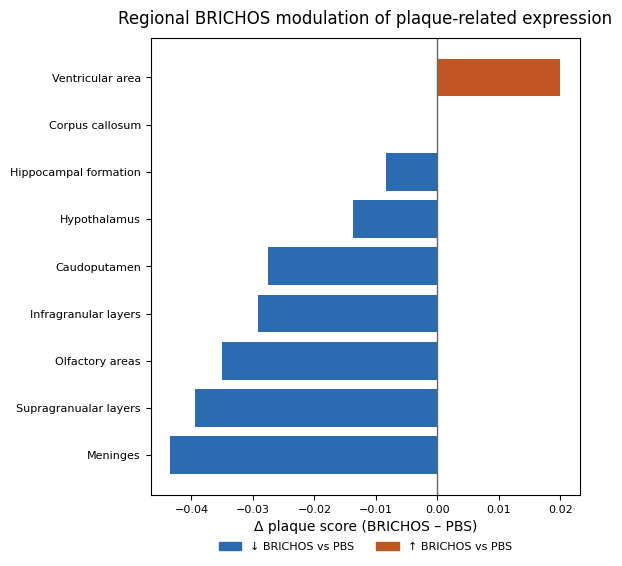

In [85]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

plot_df = res_region.sort_values("Δ_BRICHOS_minus_PBS")

colors = plot_df["Δ_BRICHOS_minus_PBS"].map(
    lambda d: "#2b6cb0" if d < 0 else "#c05621"
)

fig, ax = plt.subplots(figsize=(6, 3.5 + 0.25 * len(plot_df)))
ax.barh(plot_df["region"], plot_df["Δ_BRICHOS_minus_PBS"], color=colors)
ax.axvline(0, color="0.4", lw=1)

ax.set_xlabel("Δ plaque score (BRICHOS – PBS)")
ax.set_ylabel("")
ax.set_title("Regional BRICHOS modulation of plaque-related expression", pad=10)
ax.tick_params(axis="y", labelsize=8)
ax.tick_params(axis="x", labelsize=8)

atten_patch = mpatches.Patch(color="#2b6cb0", label="↓ BRICHOS vs PBS")
inc_patch   = mpatches.Patch(color="#c05621", label="↑ BRICHOS vs PBS")

ax.legend(
    handles=[atten_patch, inc_patch],
    loc="upper center",
    bbox_to_anchor=(0.5, -0.08),
    ncol=2,
    frameon=False,
    fontsize=8,
)

plt.tight_layout()
plt.show()

In [87]:
import numpy as np
import pandas as pd
import scanpy as sc

from anndata import AnnData
from pydeseq2.dds import DeseqDataSet, DefaultInference
from pydeseq2.ds import DeseqStats

# ------------------------------------------------
# 1) PSEUDOBULK: mouse × compartment
# ------------------------------------------------
def make_pseudobulk_by_compartment(
    adata,
    compartment_col="re_annotation_regions",   # your compartment / region column
    sample_id_col="mouse_id",                  # per-animal identifier
    condition_col="treatment",                 # WT / PBS / BRICHOS
    layer=None,                                # e.g. "counts" if present, else use .X
):
    # pick matrix
    if layer is not None and layer in adata.layers:
        X = adata.layers[layer]
    else:
        X = adata.X

    # we’ll aggregate genes per (mouse, compartment)
    obs = adata.obs[[sample_id_col, condition_col, compartment_col]].copy()
    obs = obs.astype(str)

    # build a “bulk sample id”
    obs["bulk_id"] = (
        obs[sample_id_col] + "|" +
        obs[condition_col] + "|" +
        obs[compartment_col]
    )

    bulk_ids = obs["bulk_id"].values
    uniq_bulk = pd.Index(np.unique(bulk_ids), name="bulk_id")

    # map each cell → bulk col
    codes = pd.Categorical(bulk_ids, categories=uniq_bulk).codes

    n_genes = adata.n_vars
    n_bulk  = len(uniq_bulk)

    # make dense-ish array for aggregation
    # (if data is big & sparse you can optimize, but this is clear)
    if hasattr(X, "tocsr"):
        X = X.tocsr()

    M = np.zeros((n_genes, n_bulk), dtype=np.int64)
    for j in range(n_bulk):
        idx = np.where(codes == j)[0]
        if len(idx) == 0:
            continue
        Xi = X[idx]
        if hasattr(Xi, "sum"):
            M[:, j] = Xi.sum(axis=0).A.ravel() if hasattr(Xi, "A") else Xi.sum(axis=0)
        else:
            M[:, j] = Xi.sum(0)

    # build metadata
    meta = (
        uniq_bulk.to_series()
        .str.split("|", expand=True)
        .rename(columns={0: sample_id_col, 1: condition_col, 2: compartment_col})
    )
    meta.index = uniq_bulk

    counts_df = pd.DataFrame(M, index=adata.var_names, columns=uniq_bulk)
    return counts_df, meta


# ------------------------------------------------
# 2) RUN DESEQ2 PER COMPARTMENT
# ------------------------------------------------
def run_dge_per_compartment(
    counts_df: pd.DataFrame,
    meta_df: pd.DataFrame,
    condition_col="treatment",
    ref="WT",
    contrast_levels=("PBS", "BRICHOS"),
):
    """
    For every compartment present in meta_df, run DESeq2
    on the pseudobulk samples from that compartment only.

    Returns: dict[compartment] = {level: results_df}
    """
    inference = DefaultInference(n_cpus=8)
    out = {}

    compartments = meta_df["re_annotation_regions"].unique()
    for comp in compartments:
        # subset to this compartment
        mask = meta_df["re_annotation_regions"] == comp
        meta_sub = meta_df.loc[mask].copy()
        if meta_sub.shape[0] < 3:
            # too few samples — skip
            continue
        cols_sub = meta_sub.index
        cts_sub = counts_df[cols_sub]

        # make AnnData (samples x genes)
        ad = AnnData(X=cts_sub.T.values)
        ad.var_names = cts_sub.index
        ad.obs_names = cts_sub.columns
        ad.obs = meta_sub.copy()

        # make condition categorical with ref level
        ad.obs[condition_col] = ad.obs[condition_col].astype(str)
        # keep only conditions we actually have
        present = ad.obs[condition_col].unique().tolist()
        # require reference to be present
        if ref not in present:
            # e.g. maybe in this region you only have PBS+BRICHOS
            # then set ref to the first
            ref_use = present[0]
        else:
            ref_use = ref

        ad.obs[condition_col] = pd.Categorical(
            ad.obs[condition_col],
            categories=[ref_use] + [p for p in present if p != ref_use],
            ordered=True,
        )

        # build DESeq2 object
        dds = DeseqDataSet(
            adata=ad,
            design_factors=[condition_col],
            refit_cooks=True,
            inference=inference,
        )
        dds.deseq2()

        # run desired contrasts
        comp_res = {}
        for lvl in contrast_levels:
            if lvl not in present:
                continue
            stat_res = DeseqStats(
                dds,
                contrast=[condition_col, lvl, ref_use],
                inference=inference,
            )
            stat_res.summary()
            df_res = stat_res.results_df.copy()
            df_res["compartment"] = comp
            df_res["contrast"] = f"{lvl}_vs_{ref_use}"
            comp_res[f"{lvl}_vs_{ref_use}"] = df_res

        out[comp] = comp_res

    return out




In [88]:
# ------------------------------------------------
# 3) PUT IT TOGETHER
# ------------------------------------------------
# assuming you already have:
#   adata.obs["mouse_id"]
#   adata.obs["treatment"]  (e.g. WT / PBS / BRICHOS)
#   adata.obs["re_annotation_regions"]

counts_df, meta_df = make_pseudobulk_by_compartment(
    adata,
    compartment_col="re_annotation_regions",
    sample_id_col="sample_id",
    condition_col="treatment",
    layer="counts",   # or None if your counts are in .X
)

dge_by_comp = run_dge_per_compartment(
    counts_df,
    meta_df,
    condition_col="treatment",
    ref="WT",                                  # baseline
    contrast_levels=("PBS", "BRICHOS"),        # what you want to test
)

Fitting size factors...
... done in 0.00 seconds.

Fitting dispersions...
... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.21 seconds.

Fitting MAP dispersions...
... done in 0.82 seconds.

Fitting LFCs...
... done in 0.64 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           123.342978       -0.035892  0.294452 -0.121893  0.902984   
Rp1              1.617612       -0.294363  1.515061 -0.194291  0.845948   
Sox17           87.436554        0.389888  0.289843  1.345169  0.178571   
Lypla1         209.778427       -0.035845  0.175456 -0.204297  0.838122   
Tcea1          706.216467       -0.177307  0.131241 -1.351001  0.176695   
...                   ...             ...       ...       ...       ...   
Arhgap6        255.377618       -0.155351  0.257600 -0.603071  0.546462   
Hccs           358.723891       -0.112895  0.171289 -0.659089  0.509839   
Mid1            55.598745        0.532890  0.742241  0.717947  0.472790   
4933400A11Rik    0.205837       -0.553254  3.493086 -0.158385  0.874153   
Asmt             1.732239       -0.601542  1.514676 -0.397142  0.691263   

                   padj  
Xkr4           

... done in 0.34 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           123.342978       -0.156487  0.317526 -0.492831  0.622132   
Rp1              1.617612       -0.224416  1.614036 -0.139040  0.889419   
Sox17           87.436554        0.320100  0.306695  1.043710  0.296619   
Lypla1         209.778427       -0.221119  0.189128 -1.169149  0.242344   
Tcea1          706.216467       -0.163206  0.141390 -1.154292  0.248380   
...                   ...             ...       ...       ...       ...   
Arhgap6        255.377618        0.015169  0.276523  0.054854  0.956254   
Hccs           358.723891       -0.053367  0.184093 -0.289893  0.771898   
Mid1            55.598745        0.806374  0.791195  1.019185  0.308115   
4933400A11Rik    0.205837        0.350556  3.592443  0.097582  0.922265   
Asmt             1.732239       -0.203719  1.600130 -0.127314  0.898692   

                  padj  
Xkr4        

Fitting dispersions...
... done in 0.54 seconds.

Fitting dispersion trend curve...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.78 seconds.

Fitting LFCs...
... done in 0.39 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            37.696944        0.592850  0.441507  1.342788  0.179341   
Rp1              5.241982       -0.650884  0.858705 -0.757983  0.448461   
Sox17           25.572014       -0.343488  0.467177 -0.735243  0.462192   
Lypla1          86.176775       -0.126380  0.263725 -0.479211  0.631789   
Tcea1          230.670183       -0.098637  0.194579 -0.506925  0.612208   
...                   ...             ...       ...       ...       ...   
Arhgap6         43.805800        0.730834  0.836725  0.873447  0.382420   
Hccs           139.121598        0.040146  0.249636  0.160819  0.872236   
Mid1            17.838779        0.655205  0.790726  0.828612  0.407324   
4933400A11Rik    0.243235       -0.253062  3.513624 -0.072023  0.942584   
Asmt             0.189645       -0.253605  3.509863 -0.072255  0.942399   

                   padj  
Xkr4           

... done in 0.47 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            37.696944        0.526000  0.465572  1.129792  0.258564   
Rp1              5.241982       -0.098942  0.910036 -0.108723  0.913422   
Sox17           25.572014       -0.729028  0.513339 -1.420167  0.155559   
Lypla1          86.176775        0.007840  0.281496  0.027853  0.977779   
Tcea1          230.670183       -0.021541  0.208158 -0.103481  0.917581   
...                   ...             ...       ...       ...       ...   
Arhgap6         43.805800        1.075394  0.887754  1.211365  0.225755   
Hccs           139.121598       -0.005592  0.267331 -0.020919  0.983310   
Mid1            17.838779        0.240641  0.845402  0.284647  0.775915   
4933400A11Rik    0.243235        0.425354  3.644294  0.116718  0.907084   
Asmt             0.189645        0.421924  3.640618  0.115894  0.907737   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.67 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.71 seconds.

Fitting LFCs...
... done in 0.84 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.33 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            6.556735        0.260281  1.303999  0.199602  0.841792   
Rp1             0.043800        1.833879  1.695468  1.081636  0.279414   
Sox17           5.456023        0.360417  1.494177  0.241215  0.809389   
Lypla1          5.996776       -0.237016  1.313809 -0.180404  0.856836   
Tcea1          25.428905        0.125045  1.144204  0.109286  0.912976   
...                  ...             ...       ...       ...       ...   
Arhgap6         6.743002        2.149737  1.690488  1.271666  0.203492   
Hccs            7.520052       -0.022051  1.327937 -0.016606  0.986751   
Mid1            5.804476        1.664819  1.428185  1.165689  0.243740   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.032647        0.996827  1.586057  0.628494  0.529681   

                   padj  
Xkr4           0.999978  
R

... done in 0.47 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            6.556735        0.055754  1.527957  0.036489  0.970892   
Rp1             0.043800        2.260250  1.871126  1.207962  0.227062   
Sox17           5.456023        0.943373  1.722669  0.547623  0.583951   
Lypla1          5.996776       -0.515560  1.542524 -0.334231  0.738205   
Tcea1          25.428905       -0.533259  1.348381 -0.395481  0.692488   
...                  ...             ...       ...       ...       ...   
Arhgap6         6.743002       -0.098785  2.049474 -0.048200  0.961557   
Hccs            7.520052       -0.098809  1.551895 -0.063670  0.949233   
Mid1            5.804476       -0.018110  1.709688 -0.010593  0.991548   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.032647        1.376611  1.774960  0.775573  0.438001   

                   padj  
Xkr4           0.999972

Fitting dispersions...
... done in 0.59 seconds.

Fitting dispersion trend curve...
... done in 0.22 seconds.

Fitting MAP dispersions...
... done in 0.83 seconds.

Fitting LFCs...
... done in 0.40 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.46 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            92.250268        0.036337  0.174287  0.208489  0.834847   
Rp1              1.596225       -0.428479  0.869367 -0.492863  0.622109   
Sox17           61.642162       -0.003860  0.231442 -0.016678  0.986694   
Lypla1         178.133458       -0.352123  0.154655 -2.276829  0.022796   
Tcea1          462.800933       -0.034548  0.101635 -0.339926  0.733912   
...                   ...             ...       ...       ...       ...   
Arhgap6        182.243839        0.532895  0.205204  2.596899  0.009407   
Hccs           276.696939        0.055238  0.129636  0.426099  0.670035   
Mid1            38.198175        0.593366  0.733951  0.808455  0.418829   
4933400A11Rik    0.097253       -1.382978  1.809799 -0.764161  0.444771   
Asmt             1.075546       -1.230572  1.062496 -1.158190  0.246787   

                   padj  
Xkr4           

... done in 0.34 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            92.250268       -0.143722  0.202917 -0.708278  0.478773   
Rp1              1.596225       -0.728070  1.146176 -0.635217  0.525287   
Sox17           61.642162        0.092290  0.261090  0.353480  0.723728   
Lypla1         178.133458       -0.417290  0.174628 -2.389600  0.016867   
Tcea1          462.800933       -0.104041  0.113706 -0.914999  0.360192   
...                   ...             ...       ...       ...       ...   
Arhgap6        182.243839        0.106575  0.227472  0.468521  0.639412   
Hccs           276.696939        0.126235  0.143977  0.876774  0.380610   
Mid1            38.198175        0.370070  0.792824  0.466775  0.640661   
4933400A11Rik    0.097253       -1.143001  2.418249 -0.472656  0.636458   
Asmt             1.075546       -0.303869  1.218602 -0.249358  0.803084   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.53 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.85 seconds.

Fitting LFCs...
... done in 0.36 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.46 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           108.755813        0.043033  0.289009  0.148898  0.881634   
Rp1              0.915216       -1.332566  1.199001 -1.111396  0.266398   
Sox17           65.536291       -0.121415  0.294339 -0.412501  0.679972   
Lypla1         213.867050        0.115645  0.158883  0.727860  0.466699   
Tcea1          483.649482       -0.247054  0.147685 -1.672839  0.094359   
...                   ...             ...       ...       ...       ...   
Arhgap6         34.545104       -0.157238  0.322573 -0.487450  0.625939   
Hccs           256.070915        0.086848  0.154593  0.561786  0.574262   
Mid1            48.500277        1.279481  0.742517  1.723168  0.084858   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.445179       -0.598738  1.140997 -0.524750  0.599757   

                   padj  
Xkr4           

... done in 0.33 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           108.755813       -0.054625  0.311119 -0.175575  0.860628   
Rp1              0.915216       -2.461157  1.739287 -1.415038  0.157057   
Sox17           65.536291       -0.330085  0.320542 -1.029771  0.303118   
Lypla1         213.867050       -0.046653  0.172068 -0.271130  0.786291   
Tcea1          483.649482       -0.348776  0.159280 -2.189709  0.028545   
...                   ...             ...       ...       ...       ...   
Arhgap6         34.545104        0.047130  0.346212  0.136129  0.891719   
Hccs           256.070915        0.137293  0.165906  0.827536  0.407933   
Mid1            48.500277        1.437862  0.787902  1.824925  0.068012   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.445179       -0.987228  1.339690 -0.736907  0.461179   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.45 seconds.

Fitting dispersion trend curve...
... done in 0.15 seconds.

Fitting MAP dispersions...
... done in 0.78 seconds.

Fitting LFCs...
... done in 0.35 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.35 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            9.830483       -0.492425  0.523280 -0.941036  0.346687   
Rp1             0.400425        2.087422  3.466185  0.602225  0.547025   
Sox17          21.936771        0.362283  0.429005  0.844472  0.398406   
Lypla1         24.910572       -0.311520  0.385613 -0.807855  0.419174   
Tcea1          49.357963       -0.197968  0.295604 -0.669707  0.503044   
...                  ...             ...       ...       ...       ...   
Arhgap6        11.774344        0.456893  0.580886  0.786545  0.431548   
Hccs           27.335539       -0.226134  0.374698 -0.603510  0.546169   
Mid1            5.035137        1.887327  1.171157  1.611507  0.107069   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.195980        1.198350  3.517534  0.340679  0.733345   

                   padj  
Xkr4           0.998668  
R

... done in 0.48 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            9.830483       -0.665199  0.575807 -1.155246  0.247990   
Rp1             0.400425        0.193882  3.904312  0.049659  0.960394   
Sox17          21.936771       -0.035148  0.465985 -0.075427  0.939875   
Lypla1         24.910572       -0.435283  0.418724 -1.039547  0.298551   
Tcea1          49.357963       -0.277394  0.319073 -0.869376  0.384642   
...                  ...             ...       ...       ...       ...   
Arhgap6        11.774344        0.088030  0.628703  0.140018  0.888645   
Hccs           27.335539       -0.133967  0.401475 -0.333688  0.738615   
Mid1            5.035137        0.947892  1.249101  0.758860  0.447936   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.195980        0.193882  3.891840  0.049818  0.960268   

                   padj  
Xkr4           0.999523

Fitting dispersions...
... done in 0.53 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.80 seconds.

Fitting LFCs...
... done in 0.39 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            79.851498       -0.147815  0.289995 -0.509715  0.610251   
Rp1              0.508109       -1.804633  1.852623 -0.974096  0.330009   
Sox17           28.510139        0.452704  0.383333  1.180968  0.237615   
Lypla1          88.490969        0.002011  0.229106  0.008776  0.992998   
Tcea1          249.583859       -0.285408  0.166793 -1.711156  0.087052   
...                   ...             ...       ...       ...       ...   
Arhgap6         75.003432       -0.155558  0.254736 -0.610663  0.541423   
Hccs           124.616779       -0.178497  0.183461 -0.972939  0.330583   
Mid1            25.746919        1.412677  0.890595  1.586217  0.112690   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             0.592641        2.259200  3.437013  0.657315  0.510978   

                   padj  
Xkr4           

... done in 0.35 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            79.851498       -0.296418  0.313537 -0.945400  0.344455   
Rp1              0.508109       -0.432628  1.791299 -0.241517  0.809155   
Sox17           28.510139        0.121676  0.415519  0.292829  0.769653   
Lypla1          88.490969        0.005752  0.246466  0.023338  0.981381   
Tcea1          249.583859       -0.244162  0.179471 -1.360456  0.173686   
...                   ...             ...       ...       ...       ...   
Arhgap6         75.003432       -0.044648  0.273449 -0.163277  0.870301   
Hccs           124.616779       -0.092145  0.197346 -0.466922  0.640555   
Mid1            25.746919        0.721814  0.953714  0.756845  0.449143   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             0.592641        1.998803  3.529684  0.566284  0.571201   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.56 seconds.

Fitting dispersion trend curve...
... done in 0.20 seconds.

Fitting MAP dispersions...
... done in 0.82 seconds.

Fitting LFCs...
... done in 0.39 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           197.050711       -0.025980  0.199708 -0.130091  0.896495   
Rp1              1.709571       -1.213214  1.591518 -0.762300  0.445881   
Sox17           78.128413        0.447161  0.344363  1.298515  0.194111   
Lypla1         336.013970       -0.310449  0.158660 -1.956692  0.050384   
Tcea1          756.699876       -0.071870  0.114019 -0.630338  0.528474   
...                   ...             ...       ...       ...       ...   
Arhgap6         40.356647        0.157653  0.352478  0.447271  0.654680   
Hccs           419.383628       -0.092780  0.135018 -0.687166  0.491978   
Mid1            60.588647        0.609673  0.746717  0.816472  0.414230   
4933400A11Rik    0.208216       -0.454179  3.559394 -0.127600  0.898465   
Asmt             2.045591       -0.730440  1.106706 -0.660012  0.509246   

                   padj  
Xkr4           

... done in 0.35 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           197.050711       -0.080748  0.215230 -0.375174  0.707531   
Rp1              1.709571        1.263008  1.534392  0.823133  0.410433   
Sox17           78.128413        0.456986  0.366992  1.245218  0.213052   
Lypla1         336.013970       -0.414079  0.171919 -2.408574  0.016015   
Tcea1          756.699876       -0.082071  0.122638 -0.669213  0.503360   
...                   ...             ...       ...       ...       ...   
Arhgap6         40.356647        0.323597  0.374966  0.863003  0.388136   
Hccs           419.383628       -0.106347  0.145514 -0.730834  0.464881   
Mid1            60.588647        0.317514  0.799017  0.397380  0.691087   
4933400A11Rik    0.208216        0.680123  3.636308  0.187037  0.851632   
Asmt             2.045591       -0.583227  1.223871 -0.476543  0.633688   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.40 seconds.

Fitting dispersion trend curve...
... done in 0.17 seconds.

Fitting MAP dispersions...
... done in 0.58 seconds.

Fitting LFCs...
... done in 0.35 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           211.390065        0.051274  0.340636  0.150523  0.880352   
Rp1              3.347010       -1.127316  0.886607 -1.271495  0.203553   
Sox17           80.187379        0.325799  0.381551  0.853879  0.393172   
Lypla1         360.484315        0.046991  0.329702  0.142527  0.886664   
Tcea1          727.047147       -0.013400  0.319159 -0.041986  0.966510   
...                   ...             ...       ...       ...       ...   
Arhgap6         46.317460       -0.504446  0.411483 -1.225922  0.220228   
Hccs           398.325491        0.104409  0.326652  0.319633  0.749246   
Mid1            32.398606        1.027811  0.498778  2.060659  0.039336   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.511397        0.798927  1.588929  0.502808  0.615099   

                   padj  
Xkr4           

... done in 0.34 seconds.

Fitting size factors...
... done in 0.00 seconds.



Log2 fold change & Wald test p-value: treatment BRICHOS vs WT
                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4           211.390065        0.129752  0.397126  0.326726  0.743875   
Rp1              3.347010       -2.290475  1.624845 -1.409657  0.158641   
Sox17           80.187379       -0.161196  0.461148 -0.349553  0.726674   
Lypla1         360.484315        0.120501  0.383049  0.314583  0.753078   
Tcea1          727.047147       -0.087195  0.370305 -0.235468  0.813846   
...                   ...             ...       ...       ...       ...   
Arhgap6         46.317460       -0.416010  0.497930 -0.835478  0.403449   
Hccs           398.325491        0.104206  0.379602  0.274513  0.783690   
Mid1            32.398606        0.201374  0.615794  0.327016  0.743656   
4933400A11Rik    0.000000             NaN       NaN       NaN       NaN   
Asmt             1.511397       -2.411227  3.677831 -0.655611  0.512074   

                   padj  
Xkr4       

Fitting dispersions...
... done in 0.61 seconds.

Fitting dispersion trend curve...
... done in 0.19 seconds.

Fitting MAP dispersions...
... done in 0.69 seconds.

Fitting LFCs...
... done in 0.43 seconds.

Refitting 0 outliers.

Running Wald tests...
... done in 0.34 seconds.

Running Wald tests...


Log2 fold change & Wald test p-value: treatment PBS vs WT
                baseMean  log2FoldChange     lfcSE      stat    pvalue  \
Xkr4            1.209901        2.711971  3.442761  0.787731  0.430854   
Rp1             1.132562        2.857843  3.441868  0.830317  0.406359   
Sox17           2.609723        1.518568  1.548744  0.980516  0.326832   
Lypla1         31.917165       -0.282615  0.438174 -0.644983  0.518938   
Tcea1          35.511925       -0.204675  0.369802 -0.553472  0.579940   
...                  ...             ...       ...       ...       ...   
Arhgap6         3.777857        0.112746  1.049194  0.107460  0.914424   
Hccs           17.134788        0.032511  0.543272  0.059843  0.952281   
Mid1            3.814977        0.861280  1.304244  0.660367  0.509018   
4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
Asmt            0.000000             NaN       NaN       NaN       NaN   

                   padj  
Xkr4           0.999778  
R

... done in 0.34 seconds.



In [110]:
import numpy as np
import matplotlib.pyplot as plt

def volcano_from_res(res_df, title, lfc_thr=1.0, padj_thr=0.05):
    df = res_df.copy()
    df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["log2FoldChange", "pvalue"])
    df["neglog10p"] = -np.log10(df["pvalue"] + 1e-300)

    sig = (df["padj"] < padj_thr) & (df["log2FoldChange"].abs() >= lfc_thr)
    up = sig & (df["log2FoldChange"] > 0)
    dn = sig & (df["log2FoldChange"] < 0)

    plt.figure(figsize=(5.5, 5))
    plt.scatter(df.loc[~sig, "log2FoldChange"], df.loc[~sig, "neglog10p"],
                s=8, c="lightgrey", alpha=0.5, lw=0)
    plt.scatter(df.loc[up, "log2FoldChange"], df.loc[up, "neglog10p"],
                s=15, c="#d73027", alpha=0.8, lw=0, label=f"up ({up.sum()})")
    plt.scatter(df.loc[dn, "log2FoldChange"], df.loc[dn, "neglog10p"],
                s=15, c="#4575b4", alpha=0.8, lw=0, label=f"down ({dn.sum()})")

    plt.axvline(lfc_thr, color="k", ls="--", lw=0.6)
    plt.axvline(-lfc_thr, color="k", ls="--", lw=0.6)
    plt.axhline(-np.log10(padj_thr), color="k", ls="--", lw=0.6)

    # label top 15 by p
    top = df.sort_values("pvalue").head(30)
    for g, r in top.iterrows():
        plt.text(r["log2FoldChange"], r["neglog10p"], g, fontsize=6,
                 ha="left", va="bottom")

    plt.xlabel("log₂ fold change")
    plt.ylabel("-log₁₀ p-value")
    plt.title(title)
    plt.legend(frameon=False, fontsize=7)
    plt.tight_layout()
    plt.show()



In [111]:
dge_by_comp['Meninges']

{'PBS_vs_WT':                 baseMean  log2FoldChange     lfcSE      stat    pvalue  \
 Xkr4            9.830483       -0.492425  0.523280 -0.941036  0.346687   
 Rp1             0.400425        2.087422  3.466185  0.602225  0.547025   
 Sox17          21.936771        0.362283  0.429005  0.844472  0.398406   
 Lypla1         24.910572       -0.311520  0.385613 -0.807855  0.419174   
 Tcea1          49.357963       -0.197968  0.295604 -0.669707  0.503044   
 ...                  ...             ...       ...       ...       ...   
 Arhgap6        11.774344        0.456893  0.580886  0.786545  0.431548   
 Hccs           27.335539       -0.226134  0.374698 -0.603510  0.546169   
 Mid1            5.035137        1.887327  1.171157  1.611507  0.107069   
 4933400A11Rik   0.000000             NaN       NaN       NaN       NaN   
 Asmt            0.195980        1.198350  3.517534  0.340679  0.733345   
 
                    padj compartment   contrast  
 Xkr4           0.998668    Meninge

Caudoputamen


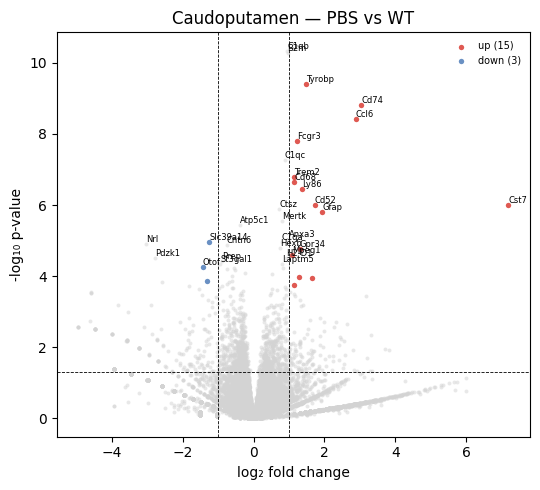

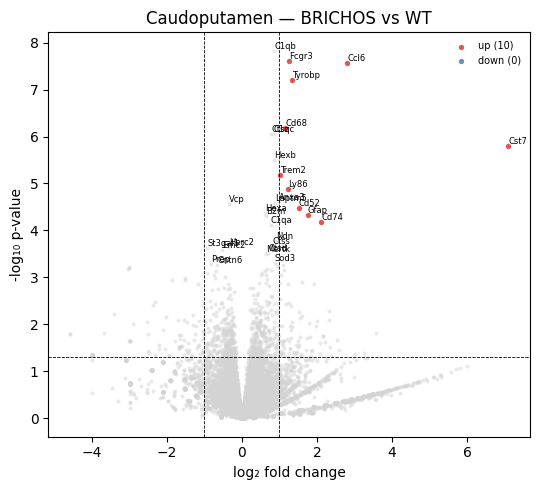

Corpus callosum


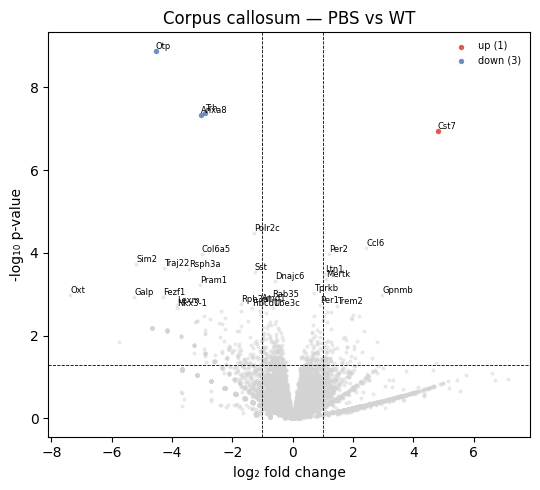

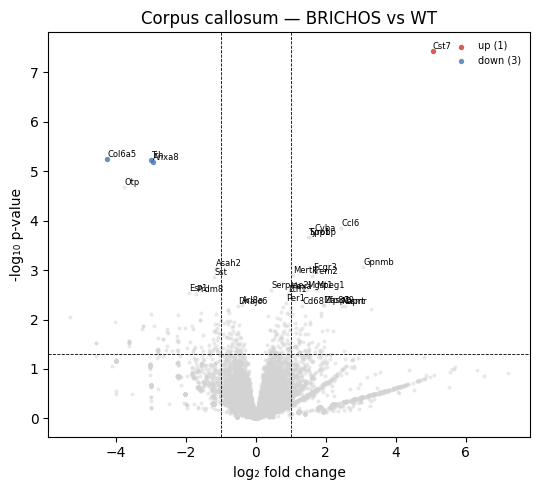

Hippocampal formation


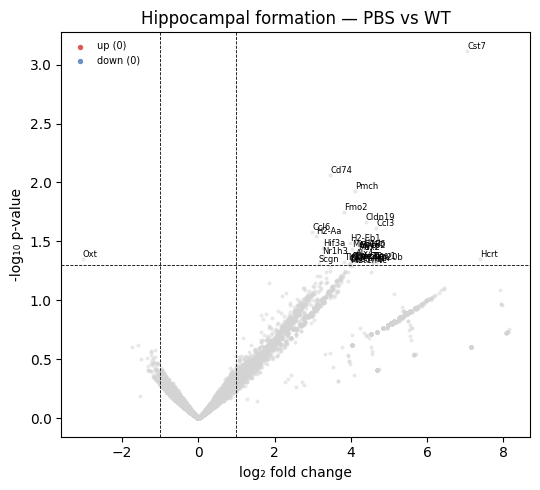

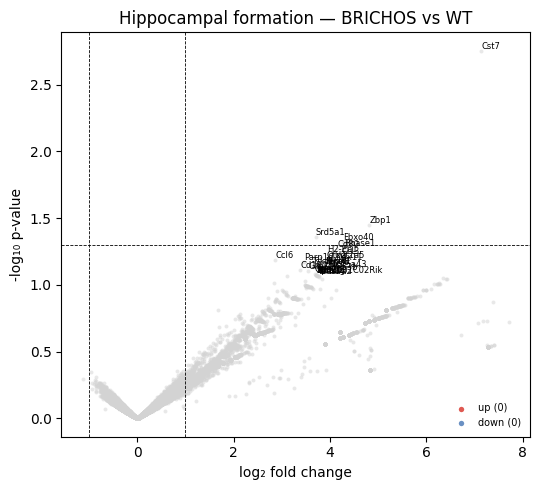

Hypothalamus


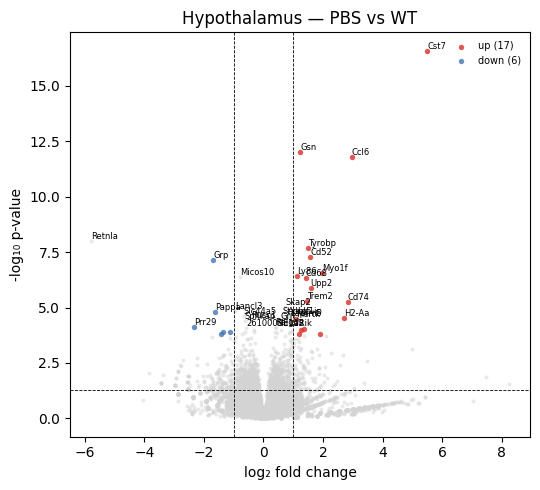

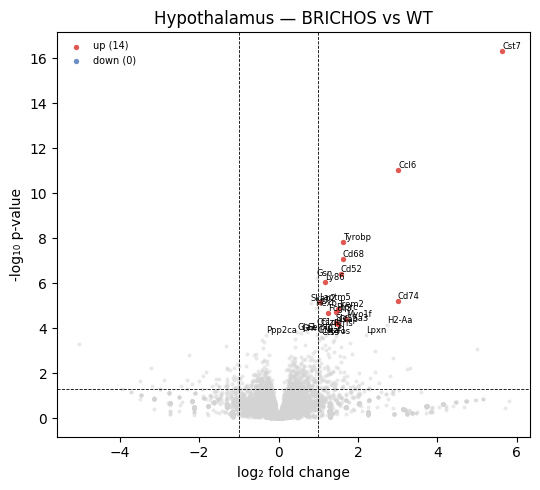

Infragranular layers


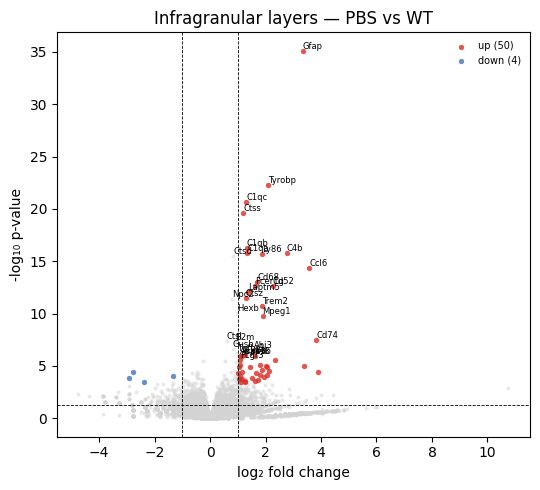

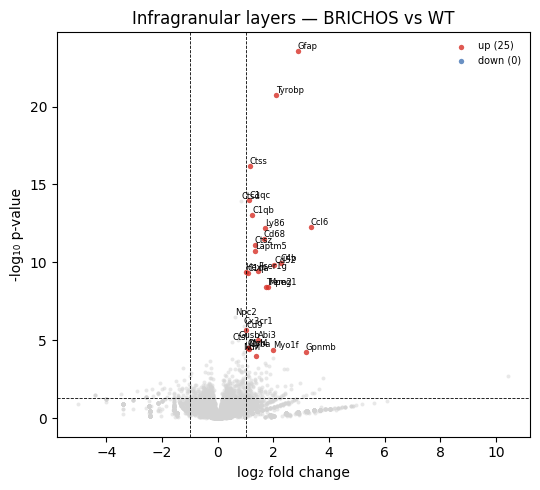

Meninges


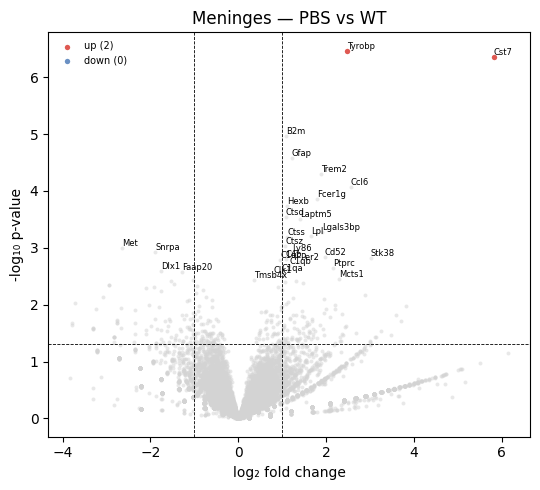

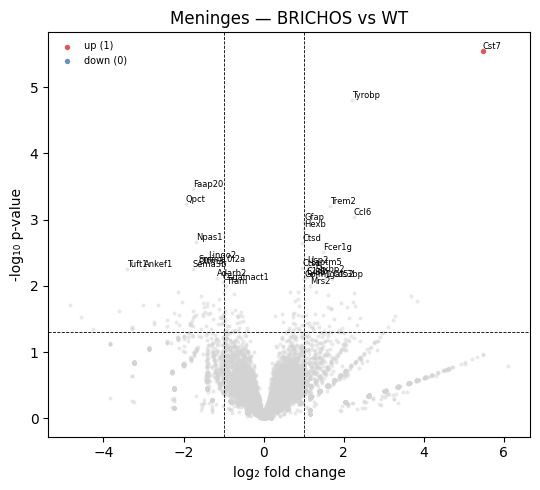

Olfactory areas


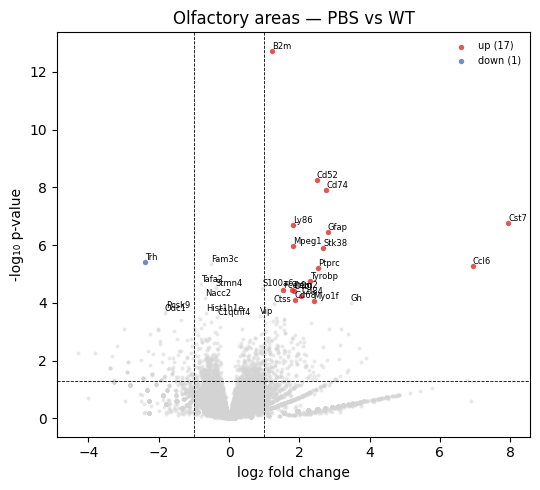

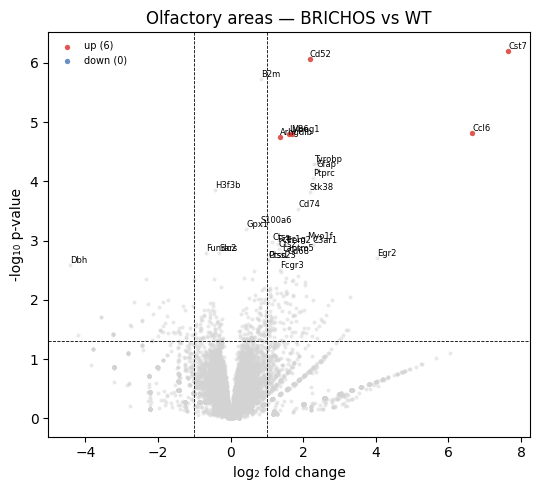

Supragranualar layers


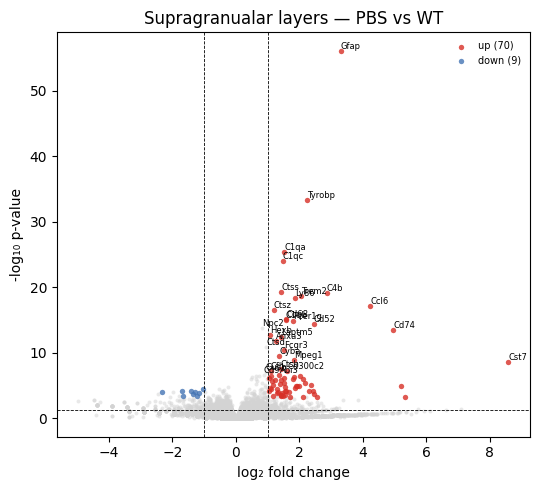

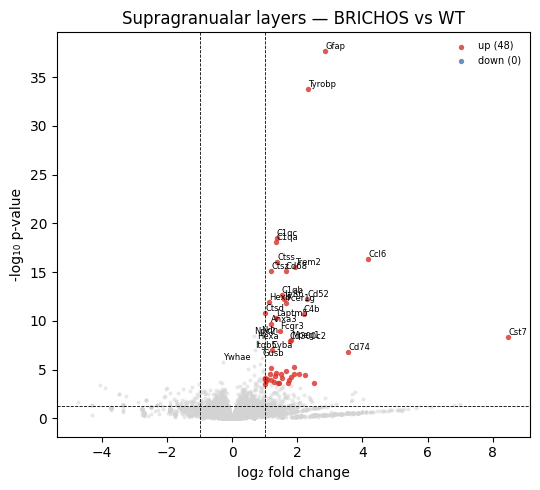

Thalamus


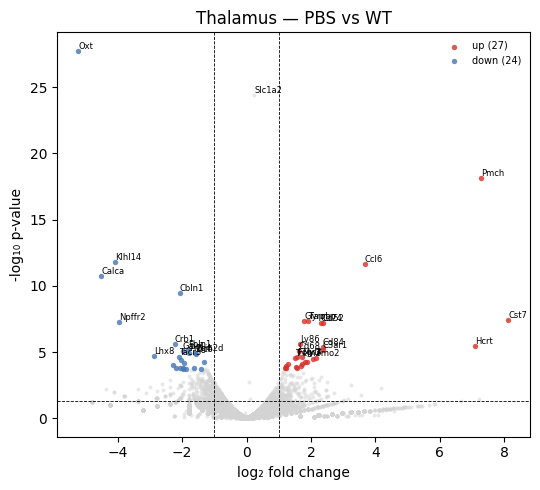

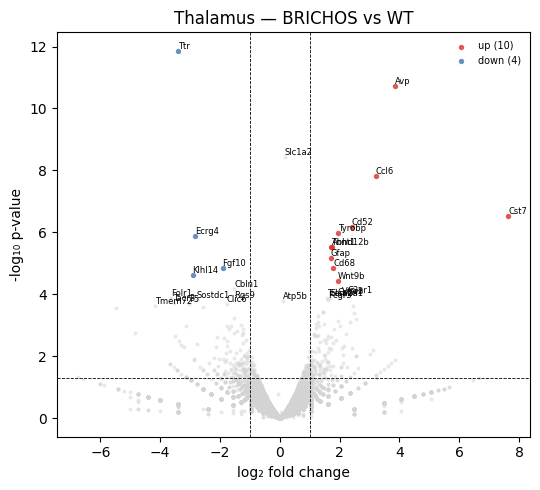

Ventricular area


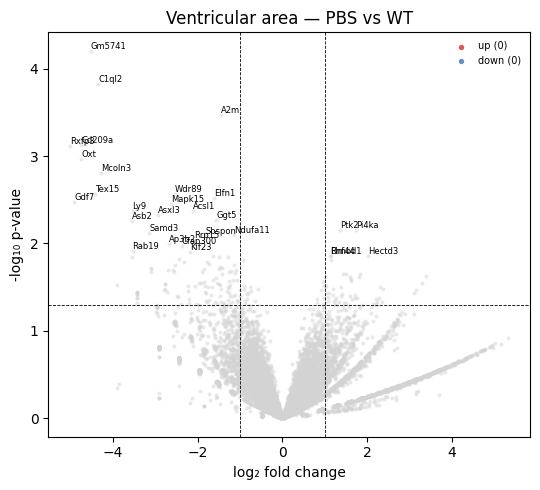

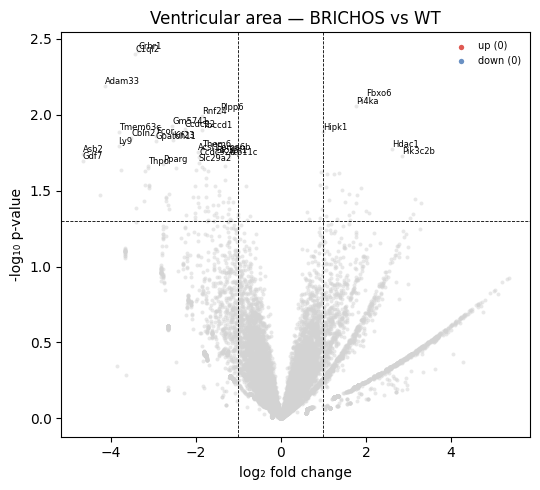

In [112]:
for comp in dge_by_comp.keys():
    print(comp)
    contrast = "PBS_vs_WT"
    if comp in dge_by_comp and contrast in dge_by_comp[comp]:
        volcano_from_res(
            dge_by_comp[comp][contrast],
            title=f"{comp} — {contrast.replace('_', ' ')}"
        )
    else:
        print("that compartment/contrast wasn't available")
    contrast = "BRICHOS_vs_WT"
    if comp in dge_by_comp and contrast in dge_by_comp[comp]:
        volcano_from_res(
            dge_by_comp[comp][contrast],
            title=f"{comp} — {contrast.replace('_', ' ')}"
        )
    else:
        print("that compartment/contrast wasn't available")

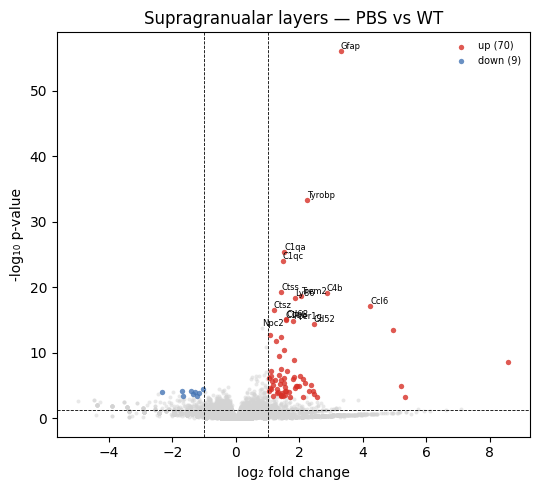

In [97]:
# example: hippocampus, BRICHOS vs PBS
comp = "Supragranualar layers"
contrast = "PBS_vs_WT"

if comp in dge_by_comp and contrast in dge_by_comp[comp]:
    volcano_from_res(
        dge_by_comp[comp][contrast],
        title=f"{comp} — {contrast.replace('_', ' ')}"
    )
else:
    print("that compartment/contrast wasn't available")

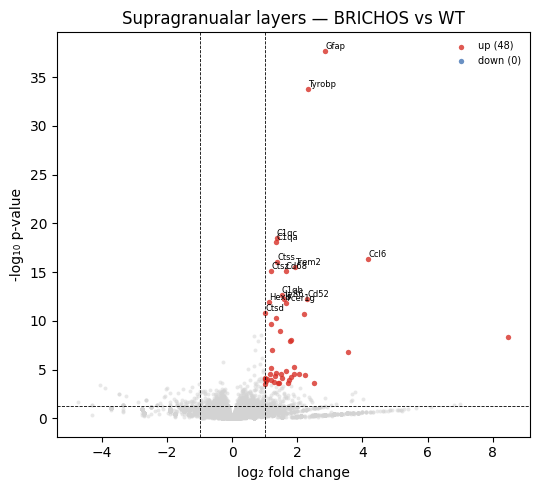

In [98]:
# example: hippocampus, BRICHOS vs PBS
comp = "Supragranualar layers"
contrast = "BRICHOS_vs_WT"

if comp in dge_by_comp and contrast in dge_by_comp[comp]:
    volcano_from_res(
        dge_by_comp[comp][contrast],
        title=f"{comp} — {contrast.replace('_', ' ')}"
    )
else:
    print("that compartment/contrast wasn't available")

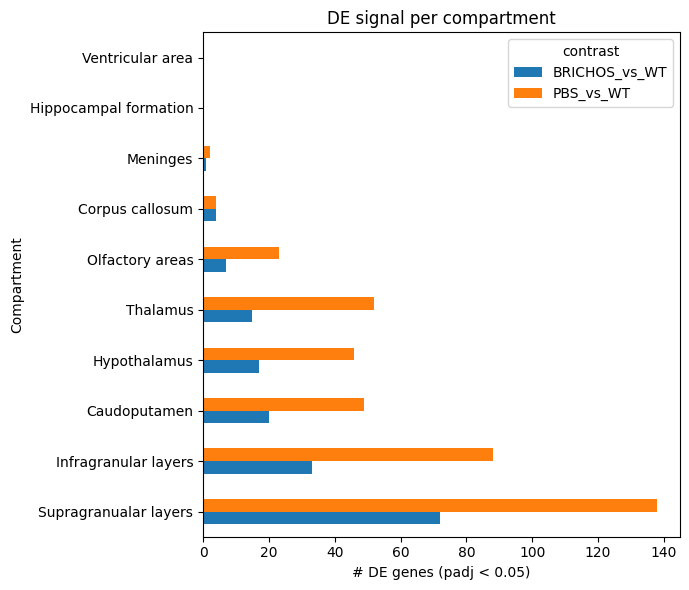

In [95]:
import matplotlib.pyplot as plt

records = []
for comp, d in dge_by_comp.items():
    for contrast, df in d.items():
        # clean
        dfc = df.replace([np.inf, -np.inf], np.nan).dropna(subset=["padj"])
        n_de = (dfc["padj"] < 0.05).sum()
        records.append({
            "compartment": comp,
            "contrast": contrast,
            "n_DE": n_de,
        })

summary = pd.DataFrame(records)

# pivot for plotting
pivot = summary.pivot(index="compartment", columns="contrast", values="n_DE").fillna(0)
pivot = pivot.sort_values(by=pivot.columns.tolist(), ascending=False)

fig, ax = plt.subplots(figsize=(7, 4 + 0.2*len(pivot)))
pivot.plot(kind="barh", ax=ax)
ax.set_xlabel("# DE genes (padj < 0.05)")
ax.set_ylabel("Compartment")
ax.set_title("DE signal per compartment")
plt.tight_layout()
plt.show()

In [116]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# assume you already have:
# dge_by_comp = {"Thalamus": {"BRICHOS_vs_PBS": res_df, ...}, ...}
# pig_genes = [...]   # your 57 plaque-induced genes

pig_res_summary = []

for region, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" not in contrasts:
        continue
    res = contrasts["BRICHOS_vs_PBS"].copy()
    res = res.replace([np.inf, -np.inf], np.nan)
    res = res.loc[res.index.intersection(pig_genes)]

    if res.empty:
        continue

    # summary stats
    n_sig = (res["padj"] < 0.05).sum()
    mean_lfc = res["log2FoldChange"].mean()
    pig_res_summary.append({
        "region": region,
        "n_PIGs": res.shape[0],
        "n_sig_PIGs": n_sig,
        "mean_log2FC": mean_lfc,
        "mean_neglog10p": -np.log10(res["pvalue"] + 1e-300).mean(),
    })

pig_summary_df = pd.DataFrame(pig_res_summary).set_index("region").sort_values("mean_log2FC")

display(pig_summary_df.style.background_gradient(cmap="coolwarm", subset=["mean_log2FC"]))

,n_PIGs,n_sig_PIGs,mean_log2FC,mean_neglog10p
region,,,,
Meninges,53,0,-0.322537,0.594132
Olfactory areas,53,0,-0.267557,0.600414
Infragranular layers,53,0,-0.211719,0.757661
Thalamus,53,0,-0.189067,0.288874
Supragranualar layers,53,1,-0.170422,0.835346
Hippocampal formation,53,0,-0.142222,0.124515
Caudoputamen,53,1,-0.077204,0.658755
Ventricular area,53,0,0.058552,0.338164
Hypothalamus,53,0,0.061276,0.489792


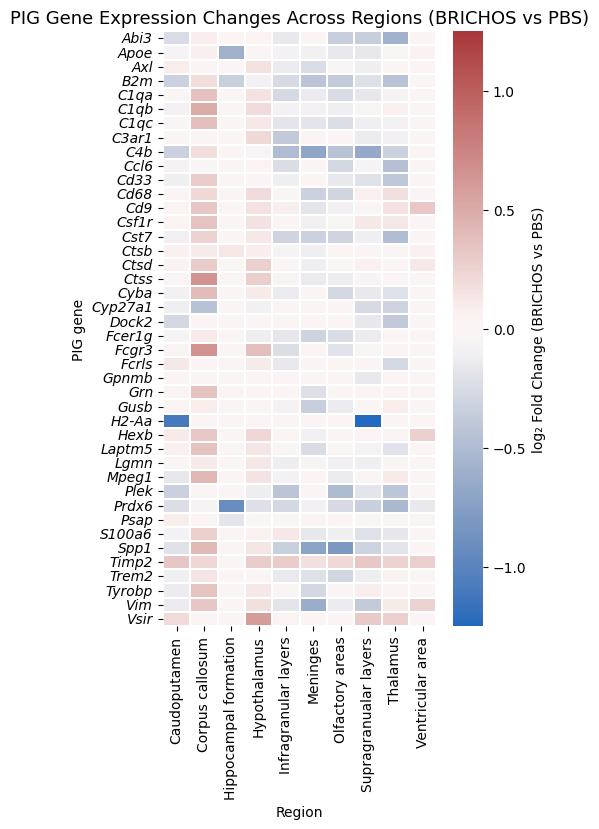

In [152]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Collect PIG fold changes per region ---
pig_fc_matrix = {}

for region, contrasts in dge_by_comp.items():
    if "BRICHOS_vs_PBS" not in contrasts:
        continue
    res = contrasts["BRICHOS_vs_PBS"].copy()
    res = res[res.baseMean > 50]
    # res = res[res.padj < 0.1]  # optional filter for significance
    res = res.loc[res.index.intersection(pig_genes)]
    pig_fc_matrix[region] = res["log2FoldChange"]

# --- Assemble matrix (genes × regions) ---
pig_fc_df = pd.DataFrame(pig_fc_matrix).fillna(0)

# --- Symmetric color scale ---
vmax = 1.25
vmin = -vmax

# --- Plot heatmap ---
plt.figure(figsize=(5, max(4, len(pig_fc_df) * 0.2)))
ax = sns.heatmap(
    pig_fc_df,
    cmap=sns.color_palette("vlag", as_cmap=True),
    center=0,
    vmin=vmin,
    vmax=vmax,
    cbar_kws={"label": "log₂ Fold Change (BRICHOS vs PBS)"},
    linewidths=0.3,
)

# Italicize y-axis gene labels
for label in ax.get_yticklabels():
    label.set_fontstyle("italic")

plt.title("PIG Gene Expression Changes Across Regions (BRICHOS vs PBS)", fontsize=13)
plt.xlabel("Region")
plt.ylabel("PIG gene")
plt.tight_layout()
plt.show()


===== Caudoputamen =====


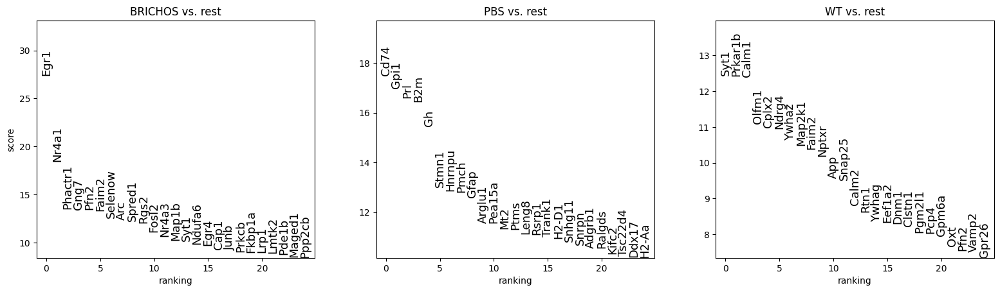

Top markers by treatment in Caudoputamen:
  BRICHOS: Egr1 Nr4a1 Phactr1 Gng7 Pfn2
  PBS: Cd74 Gpi1 Prl B2m Gh
  WT: Syt1 Prkar1b Calm1 Olfm1 Cplx2


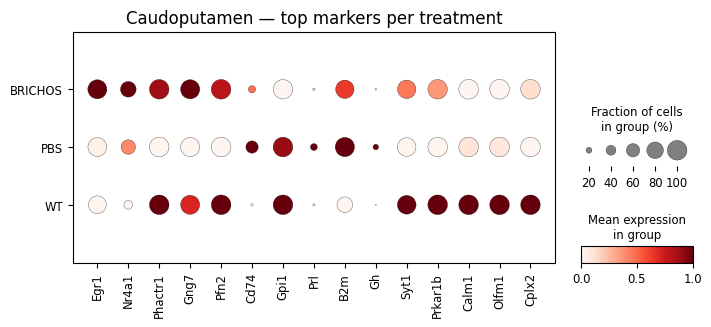


===== Corpus callosum =====


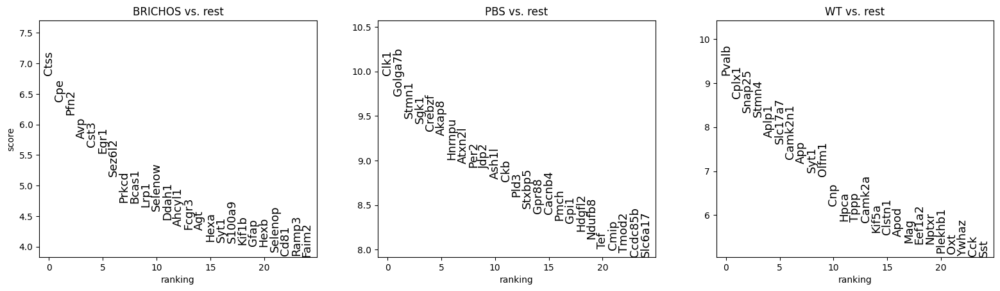

Top markers by treatment in Corpus callosum:
  BRICHOS: Ctss Cpe Pfn2 Avp Cst3
  PBS: Clk1 Golga7b Stmn1 Sgk1 Crebzf
  WT: Pvalb Cplx1 Snap25 Stmn4 Aplp1


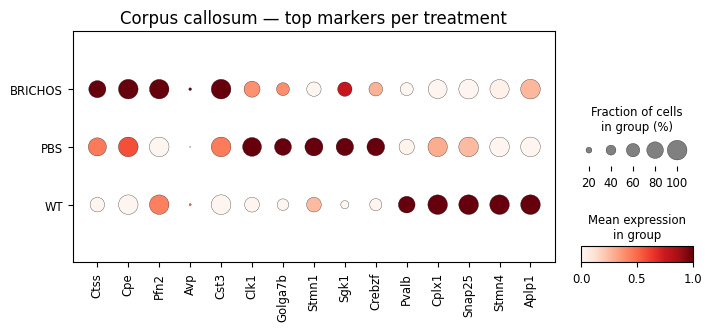


===== Hippocampal formation =====


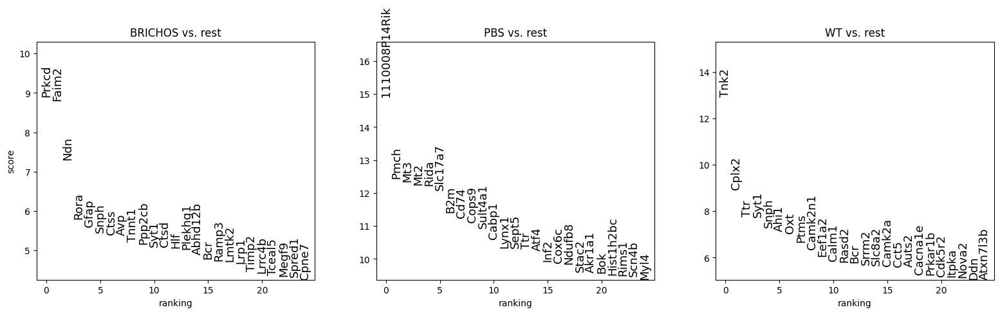

Top markers by treatment in Hippocampal formation:
  BRICHOS: Prkcd Faim2 Ndn Rora Gfap
  PBS: 1110008P14Rik Pmch Mt3 Mt2 Rida
  WT: Tnk2 Cplx2 Ttr Syt1 Snph


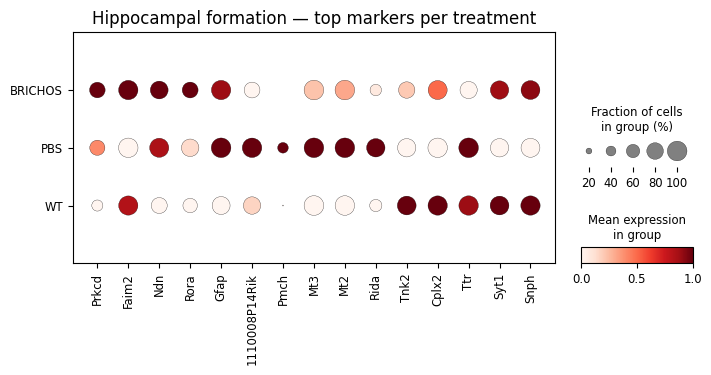


===== Hypothalamus =====


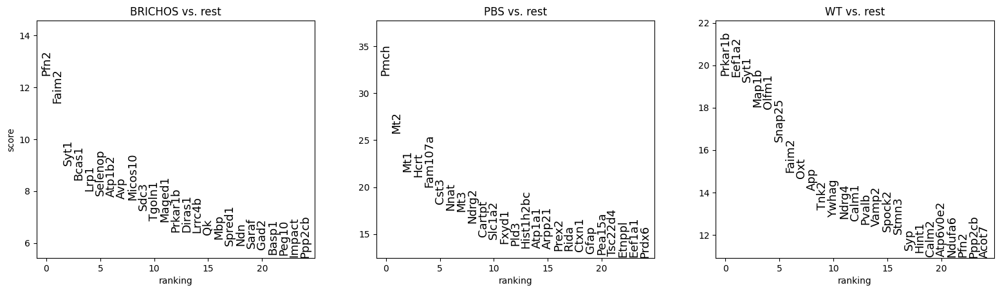

Top markers by treatment in Hypothalamus:
  BRICHOS: Pfn2 Faim2 Syt1 Bcas1 Lrp1
  PBS: Pmch Mt2 Mt1 Hcrt Fam107a
  WT: Prkar1b Eef1a2 Syt1 Map1b Olfm1


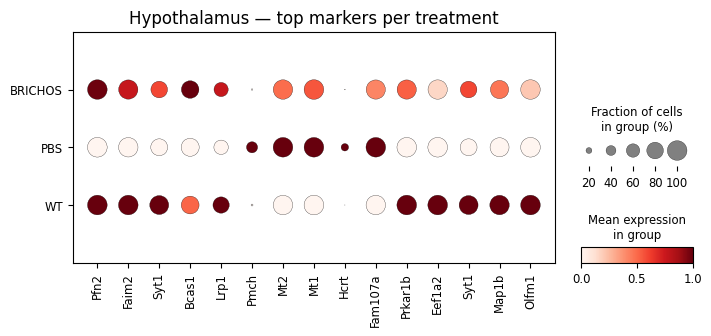


===== Infragranular layers =====


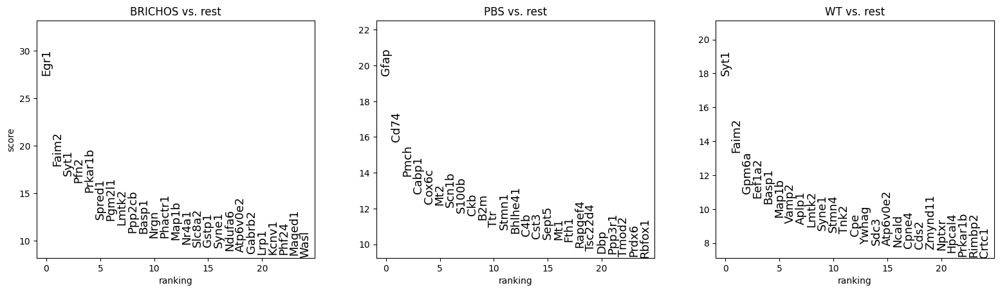

Top markers by treatment in Infragranular layers:
  BRICHOS: Egr1 Faim2 Syt1 Pfn2 Prkar1b
  PBS: Gfap Cd74 Pmch Cabp1 Cox6c
  WT: Syt1 Faim2 Gpm6a Eef1a2 Basp1


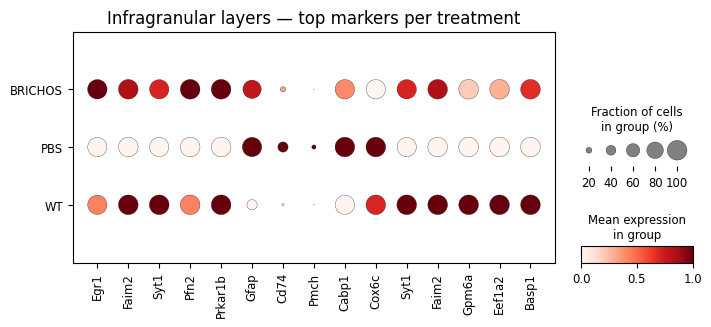


===== Meninges =====


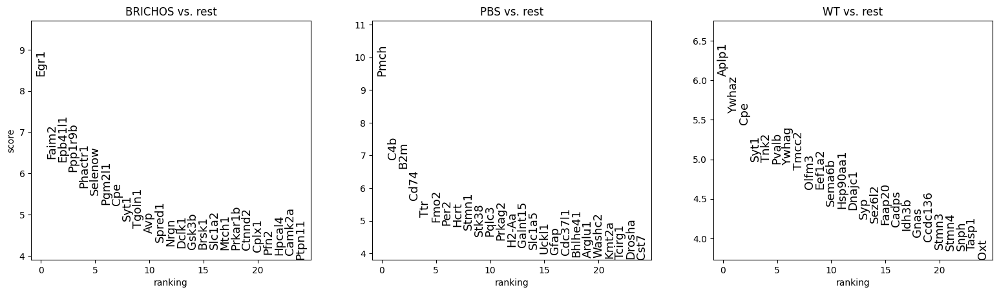

Top markers by treatment in Meninges:
  BRICHOS: Egr1 Faim2 Epb41l1 Ppp1r9b Phactr1
  PBS: Pmch C4b B2m Cd74 Ttr
  WT: Aplp1 Ywhaz Cpe Syt1 Tnk2


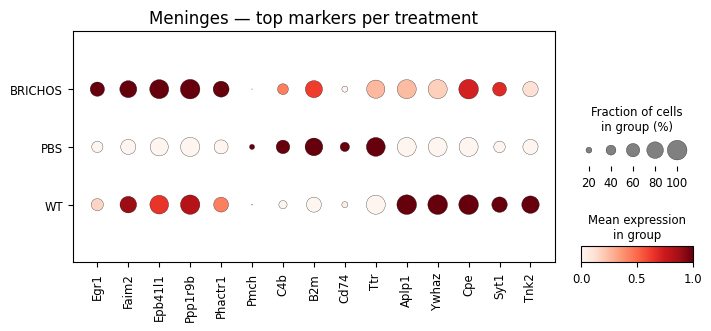


===== Olfactory areas =====


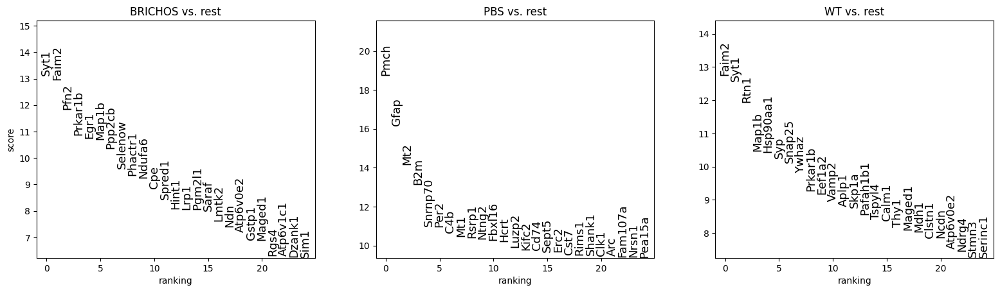

Top markers by treatment in Olfactory areas:
  BRICHOS: Syt1 Faim2 Pfn2 Prkar1b Egr1
  PBS: Pmch Gfap Mt2 B2m Snrnp70
  WT: Faim2 Syt1 Rtn1 Map1b Hsp90aa1


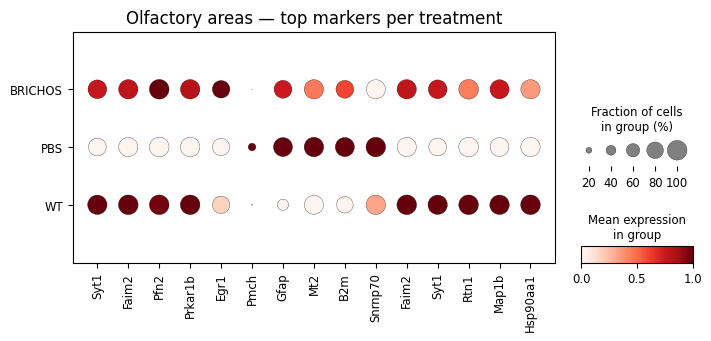


===== Supragranualar layers =====


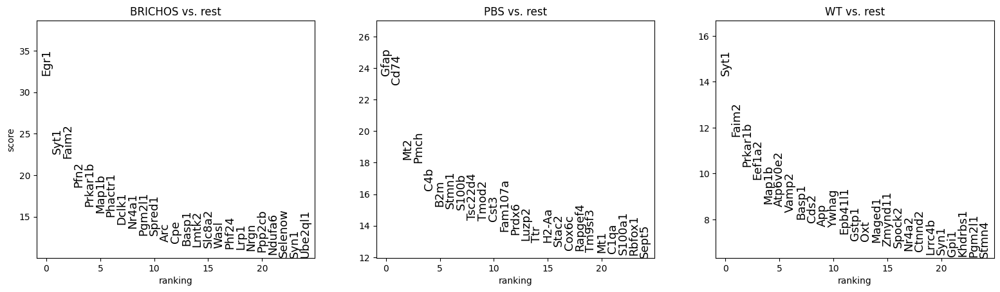

Top markers by treatment in Supragranualar layers:
  BRICHOS: Egr1 Syt1 Faim2 Pfn2 Prkar1b
  PBS: Gfap Cd74 Mt2 Pmch C4b
  WT: Syt1 Faim2 Prkar1b Eef1a2 Map1b


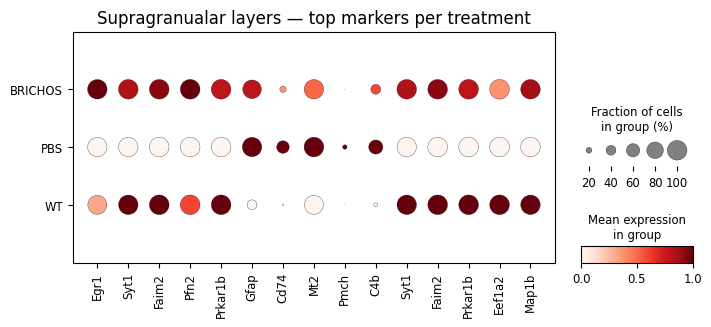


===== Thalamus =====


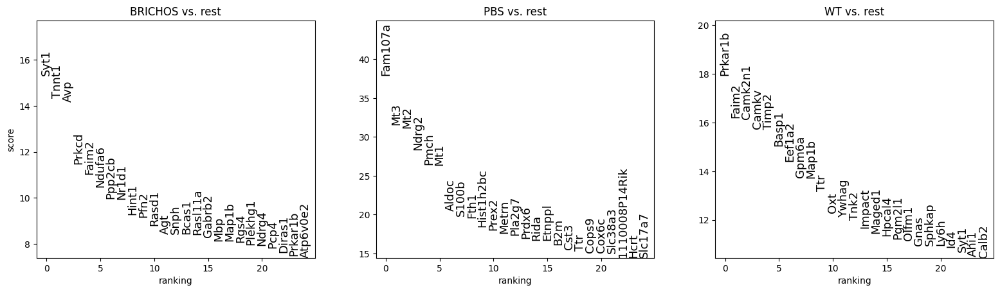

Top markers by treatment in Thalamus:
  BRICHOS: Syt1 Tnnt1 Avp Prkcd Faim2
  PBS: Fam107a Mt3 Mt2 Ndrg2 Pmch
  WT: Prkar1b Faim2 Camk2n1 Camkv Timp2


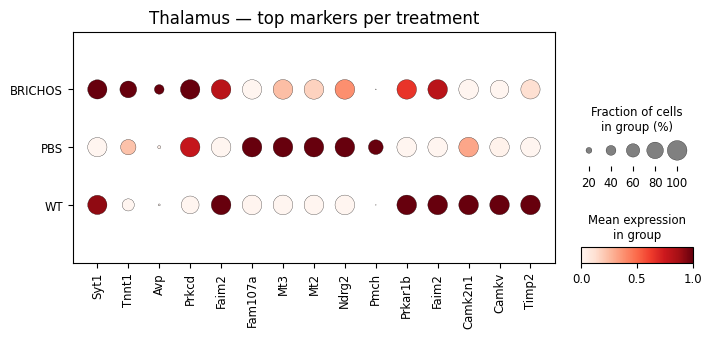


===== Ventricular area =====


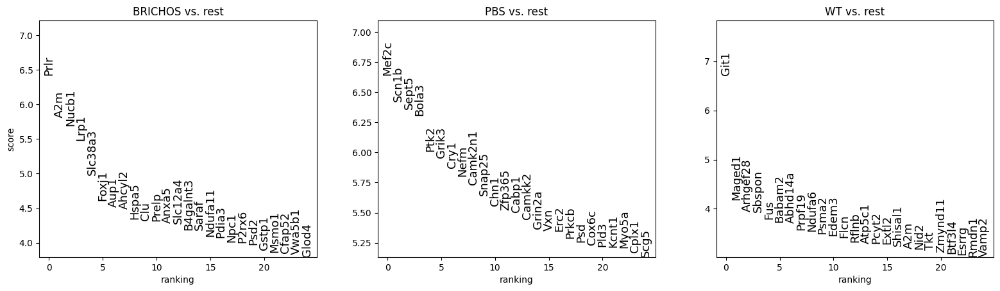

Top markers by treatment in Ventricular area:
  BRICHOS: Prlr A2m Nucb1 Lrp1 Slc38a3
  PBS: Mef2c Scn1b Sept5 Bola3 Ptk2
  WT: Git1 Maged1 Arhgef28 Sbspon Fus


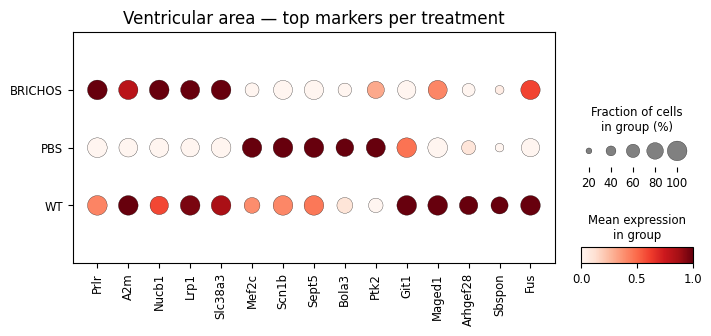

In [169]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt

# --- Loop through regions ---
region_marker_dict = {}  # store results by region

for region, contrasts in dge_by_comp.items():
    print(f"\n===== {region} =====")
    adata_reg = adata[adata.obs['re_annotation_regions'] == region]
    
    # --- Find marker genes per treatment ---
    sc.tl.rank_genes_groups(adata_reg, groupby="treatment", method="t-test")
    sc.pl.rank_genes_groups(adata_reg, n_genes=25, sharey=False, fontsize=13)
    
    # --- Extract top marker genes ---
    markers = sc.get.rank_genes_groups_df(adata_reg, group=None)
    marker_genes = {
        group: adata_reg.uns['rank_genes_groups']['names'][group][:5].tolist()
        for group in adata_reg.uns['rank_genes_groups']['names'].dtype.names
    }

    # Store in dictionary
    region_marker_dict[region] = marker_genes

    # --- Flatten all gene lists for plotting ---
    combined_list = [g for genes in marker_genes.values() for g in genes]
    print(f"Top markers by treatment in {region}:")
    for k, v in marker_genes.items():
        print(f"  {k}: {' '.join(v)}")
    
    # --- Dotplot visualization ---
    sc.pl.dotplot(
        adata_reg,
        var_names=combined_list,
        groupby="treatment",
        standard_scale="var",
        color_map="Reds",
        figsize=(8, 3),
        title=f"{region} — top markers per treatment",
    )

# optional: save the dictionary
# pd.DataFrame(region_marker_dict).to_json("../results/region_markers.json")

In [172]:
contrasts

{'PBS_vs_WT':                  baseMean  log2FoldChange     lfcSE      stat    pvalue  \
 Xkr4           123.342978       -0.035892  0.294452 -0.121893  0.902984   
 Rp1              1.617612       -0.294363  1.515061 -0.194291  0.845948   
 Sox17           87.436554        0.389888  0.289843  1.345169  0.178571   
 Lypla1         209.778427       -0.035845  0.175456 -0.204297  0.838122   
 Tcea1          706.216467       -0.177307  0.131241 -1.351001  0.176695   
 ...                   ...             ...       ...       ...       ...   
 Arhgap6        255.377618       -0.155351  0.257600 -0.603071  0.546462   
 Hccs           358.723891       -0.112895  0.171289 -0.659089  0.509839   
 Mid1            55.598745        0.532890  0.742241  0.717947  0.472790   
 4933400A11Rik    0.205837       -0.553254  3.493086 -0.158385  0.874153   
 Asmt             1.732239       -0.601542  1.514676 -0.397142  0.691263   
 
                    padj   compartment   contrast  
 Xkr4           0.987

In [226]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_gene_across_regions(
    adata,
    gene,
    region_key="re_annotation_regions",
    treatment_key="treatment",
    sample_key="sample_id",
    palette=("#e3b505", "#0077b6", "#9b2226"),
    figsize=(10, 5),
    show_legend=True,
):
    """
    Plot mean expression (±SEM) and per-mouse dots across regions and treatments.

    Parameters
    ----------
    adata : AnnData
        Input spatial or single-cell dataset with obs containing sample, treatment, and region info.
    gene : str
        Gene name to plot.
    region_key : str, default="re_annotation_regions"
        Column name in adata.obs that defines brain regions.
    treatment_key : str, default="treatment"
        Column name in adata.obs that defines treatment group (e.g. PBS, BRICHOS, WT).
    sample_key : str, default="sample_id"
        Column name in adata.obs that identifies biological replicates / mice.
    palette : tuple
        Colors for treatments (must match number of treatment levels).
    figsize : tuple
        Size of the figure.
    show_legend : bool, default=True
        Whether to display the legend.
    """

    # --- Extract expression and metadata ---
    expr = adata.to_df()
    meta = adata.obs[[sample_key, treatment_key, region_key]]
    df = (
        expr.join(meta)
        .groupby([sample_key, treatment_key, region_key])
        .mean()
        .reset_index()
    )

    # --- Compute mean and SEM ---
    def safe_sem(x):
        x = np.asarray(x, float)
        return np.nan if len(x) < 2 else x.std(ddof=1) / np.sqrt(len(x))

    summary = (
        df.groupby([treatment_key, region_key])[gene]
        .agg(mean="mean", sem=safe_sem, n="count")
        .reset_index()
    )

    # --- Plot ---
    plt.figure(figsize=figsize)

    # Bars + error bars
    sns.barplot(
        data=summary,
        x=region_key,
        y="mean",
        hue=treatment_key,
        palette=palette,
        capsize=0.05,
        errwidth=1.2,
    )

    # Dots (individual mice)
    sns.stripplot(
        data=df,
        x=region_key,
        y=gene,
        hue=treatment_key,
        dodge=True,
        palette=palette,
        marker="o",
        edgecolor="black",
        linewidth=0.3,
        size=3.5,
        alpha=0.7,
    )

    # Clean legend
    handles, labels = plt.gca().get_legend_handles_labels()
    if show_legend:
        plt.legend(
            handles[: len(summary[treatment_key].unique())],
            labels[: len(summary[treatment_key].unique())],
            title="Treatment",
            frameon=False,
            bbox_to_anchor=(1.02, 1),
            loc="upper left",
        )
    else:
        plt.legend([], [], frameon=False)

    plt.xticks(rotation=45, ha="right")
    plt.ylabel(f"{gene} mean expression (per mouse)")
    plt.title(f"{gene} expression across regions and treatments\n(single WT mouse shown as single dot)")
    plt.tight_layout()
    plt.show()

    return summary

In [231]:
pig_genes

['Abi3',
 'Apoe',
 'Axl',
 'B2m',
 'C1qa',
 'C1qb',
 'C1qc',
 'C3ar1',
 'C4b',
 'Ccl6',
 'Cd33',
 'Cd68',
 'Cd9',
 'Csf1',
 'Csf1r',
 'Cst7',
 'Ctss',
 'Ctsb',
 'Ctsd',
 'Cyba',
 'Cyp27a1',
 'Dock2',
 'Fcgr1',
 'Fcgr2b',
 'Fcgr3',
 'Fcer1g',
 'Fcrls',
 'Gpnmb',
 'Grn',
 'Gusb',
 'Hexb',
 'H2-Ab1',
 'H2-Eb1',
 'H2-Aa',
 'Itgax',
 'Laptm5',
 'Lgmn',
 'Lyz2',
 'Mpeg1',
 'Msr1',
 'Pf4',
 'Plek',
 'Prdx6',
 'Psap',
 'S100a4',
 'S100a6',
 'S100a11',
 'Spp1',
 'Timp2',
 'Trem2',
 'Tyrobp',
 'Vim',
 'Vsir']

In [246]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def plot_multiple_genes_across_regions(
    adata,
    genes,
    region_key="re_annotation_regions",
    treatment_key="treatment",
    sample_key="sample_id",
    palette=("#e3b505", "#0077b6", "#9b2226"),
    save_base=None,      # e.g. "results/BBB_markers"
    figsize=(10, 4),
):
    """
    Plot mean expression (±SEM) and per-mouse dots across regions and treatments
    for several genes (one subplot per gene).

    Parameters
    ----------
    adata : AnnData
        Spatial/single-cell dataset with obs containing sample, treatment, and region.
    genes : list of str
        Gene symbols (e.g. ["Cldn5","Ocln","F11r","Tjp1"]).
    region_key : str
        Column in adata.obs with region annotation.
    treatment_key : str
        Column in adata.obs with treatment (e.g. PBS, BRICHOS, WT).
    sample_key : str
        Column in adata.obs identifying biological replicates.
    palette : tuple
        Colors for treatments.
    save_base : str or None
        If given, saves figures as PNG and summary CSV (e.g. "results/BBB_markers").
    figsize : tuple
        Figure size for each subplot.
    """

    # --- Extract data ---
    expr = adata.to_df()
    meta = adata.obs[[sample_key, treatment_key, region_key]]
    df = (
        expr.join(meta)
        .groupby([sample_key, treatment_key, region_key])
        .mean()
        .reset_index()
    )

    def safe_sem(x):
        x = np.asarray(x, float)
        return np.nan if len(x) < 2 else x.std(ddof=1) / np.sqrt(len(x))

    summaries = []

    n_genes = len(genes)
    ncols = 2
    nrows = int(np.ceil(n_genes / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=((figsize[0]*ncols)*0.5, figsize[1]*nrows))
    axes = np.ravel(axes)

    for ax, gene in zip(axes, genes):
        # --- Summary per region/treatment ---
        summary = (
            df.groupby([treatment_key, region_key])[gene]
            .agg(mean="mean", sem=safe_sem, n="count")
            .reset_index()
        )
        summary["gene"] = gene
        summaries.append(summary)

        # --- Plot ---
        sns.barplot(
            data=summary,
            x=region_key,
            y="mean",
            hue=treatment_key,
            palette=palette,
            capsize=0.05,
            errwidth=1.2,
            ax=ax,
        )
        sns.stripplot(
            data=df,
            x=region_key,
            y=gene,
            hue=treatment_key,
            dodge=True,
            palette=palette,
            marker="o",
            edgecolor="black",
            linewidth=0.3,
            size=3.0,
            alpha=0.7,
            ax=ax,
        )

        ax.set_title(gene, fontsize=12, style="italic")
        ax.set_xlabel("")
        ax.set_ylabel("Mean expression (per mouse)")
        ax.tick_params(axis="x", rotation=90)
        ax.legend_.remove()

    # unified legend
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles[: len(palette)], labels[: len(palette)], title="Treatment",
               frameon=False, bbox_to_anchor=(1.02, 1), loc="upper left")

    plt.suptitle("Tight junction / BBB integrity markers across brain regions", y=1.02)
    plt.tight_layout()

    if save_base:
        fig.savefig(f"{save_base}.png", dpi=300, bbox_inches="tight")
        fig.savefig(f"{save_base}.pdf", bbox_inches="tight")

    summary_all = pd.concat(summaries, ignore_index=True)
    if save_base:
        summary_all.to_csv(f"{save_base}_summary.csv", index=False)

    plt.show()
    return summary_all

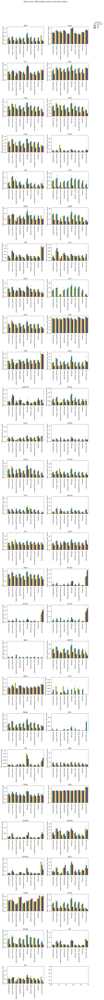

In [247]:

summary_bbb = plot_multiple_genes_across_regions(
    adata,
    genes=pig_genes,
   # save_base="results/BBB_markers"
)